# Web Scraping from Indeed and Predicting Salaries

In [1]:
#Function to extract parameters(Title, Location, Salary, URL, Date Posted, Summary) from Indeed

from bs4 import BeautifulSoup
import requests
import urllib.parse
import csv
from datetime import datetime

def get_url(position,location,jobtype,dateposted):
    template = 'https://www.indeed.com/jobs?q={}&l={}&jt={}&fromage={}'
    url = template.format(position,location,jobtype,dateposted)
    return url

def get_record(card):
    atag = card.h2.a
    try:
        job_title = atag.get('title')
    except AttributeError:
        job_title = ''
    job_url = 'https://www.indeed.com' + atag.get('href')
    try:
        company = card.find('span','company').text.strip()
    except AttributeError:
        company = ''
    job_location = card.find('div','recJobLoc').get('data-rc-loc')
    job_summary = card.find('div','summary').text.strip()
    post_date = card.find('span','date').text
    today = datetime.today().strftime('%m-%d-%Y')
    try:
        job_salary = card.find('span','salaryText').text.strip()
    except AttributeError:
        job_salary = ""
    
    record = (job_title, company, job_location, post_date, today, job_summary, job_salary, job_url)
    
    return record

def main(position,location,jobtype,dateposted):
    records = []
    url = get_url(position,location,jobtype,dateposted)
    
    while True:
        response = requests.get(url)
        soup = BeautifulSoup(response.text,'html.parser')
        cards = soup.find_all('div','jobsearch-SerpJobCard')
        
        for card in cards:
            record = get_record(card)
            records.append(record)
        try:
            url = 'https://www.indeed.com' + soup.find('a',{"aria-label":"Next"}).get('href')
        except AttributeError:
            break
    #Replace file name every time to save new records        
    with open('results.csv', 'w', newline='', encoding='utf-8') as f:
        writer = csv.writer(f)
        writer.writerow(['Title', 'Company', 'Location', 'PostDate', 'ExtractDate', 'Summary', 'Salary', 'JobUrl'])
        writer.writerows(records)

In [ ]:
#Field 1: Position
#Field 2: Location
#Field 3: Full Time / Internship
#Field 4: 1 = Last 24 hours, 3 = Last 3 days, 7 = Last 7 days, 14 = Last 14 days, last = Since your last visit

main('Data Analyst','united states','full time','14')

In [2]:
#Libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [3]:
#Creating DataFrame of Data Analys, Data Science, Data Engineer, Business Analyst, Business Intelligence, Software Engineer

df1 = pd.read_csv('results1.csv')
df2 = pd.read_csv('results2.csv')
df3 = pd.read_csv('results3.csv')
df4 = pd.read_csv('results4.csv')
df5 = pd.read_csv('results5.csv')
df6 = pd.read_csv('results6.csv')

In [4]:
#Concatenation of DataFrames

df = pd.concat([df1, df2, df3, df4, df5, df6], ignore_index=True, sort=False)

In [5]:
df.drop(['PostDate', 'ExtractDate', 'Summary', 'JobUrl'],axis=1,inplace=True)

In [6]:
#removing duplicates

df.drop_duplicates(inplace = True)

In [7]:
#removing job posting that dont include salary

df.dropna(inplace=True)

In [8]:
df.dtypes

Title       object
Company     object
Location    object
Salary      object
dtype: object

In [9]:
#Function to extract loacation based on states

def location_clean(df_col):
    new_column = []
    for i in df_col.map(lambda x: x.split(',')[-1]):
        x = np.array(i, dtype= object)
        new_column.append(x) 
    return new_column

In [10]:
df.Location = location_clean(df.Location)

In [11]:
df.head()

,Title,Company,Location,Salary
2,Data Scientist Consultant,Zora Digital,Remote,Up to $75 an hour
6,Data Scientist - Fully Remote,DataSource.ai,CA,"$113,114 - $221,749 a year"
7,Jr. Data Scientist,Dash Technologies Inc,KS,"$76,029 - $105,000 a year"
9,Data Scientist - Entry to Experienced Level,National Security Agency (NSA),MD,"$102,663 - $157,709 a year"
11,Data Scientist,"Avicena, LLC",Remote,"$120,000 - $150,000 a year"


In [12]:
df.tail()

,Title,Company,Location,Salary
6450,Hacedor,The Yerba Mate Co.,MA,"$35,000 a year"
6451,Sr. Data Developer,"Daraja Enterprises, Inc.",AZ,"$55,000 - $85,000 a year"
6454,Concur Technician,Falcon IT & Staffing Solutions LLC,MD,"$98,000 a year"
6459,Financial Analyst,Robert Half,MA,$20 - $25 an hour
6463,Outreach Specialist - Work from Home - Bi-Lingual,The Drexel Group Inc.,PA,$17 an hour


In [13]:
df.Salary.unique()

array(['Up to $75 an hour', '$113,114 - $221,749 a year',
       '$76,029 - $105,000 a year', '$102,663 - $157,709 a year',
       '$120,000 - $150,000 a year', '$65,000 - $120,000 a year',
       '$130,000 - $140,000 a year', '$70,000 a year',
       '$70,315 - $90,405 a year', '$100,000 - $110,000 a year',
       '$50 - $60 an hour', '$120,000 a year', '$50,000 a year',
       '$45 - $75 an hour', '$97,700 - $136,900 a year',
       '$40 - $60 an hour', '$73,000 - $98,000 a year',
       'Up to $180,000 a year', '$63,503 - $157,709 a year',
       '$75,000 - $90,000 a year', '$97,463 - $190,000 a year',
       '$47,986 - $61,194 a year', '$52,905 - $93,638 a year',
       '$64,009 - $130,039 a year', '$76,721 - $118,603 a year',
       '$90,000 - $100,000 a year', '$52,905 - $101,503 a year',
       '$15 - $18 an hour', 'From $45 an hour', '$24 - $27 an hour',
       '$90,000 - $150,000 a year', '$55 - $65 an hour',
       '$60,000 - $85,000 a year', '$70,000 - $85,000 a year',
     

In [14]:
#Keeping salaries per year

df.drop(df[~df['Salary'].str.contains('a year')].index, inplace = True)

In [15]:
df.head()

,Title,Company,Location,Salary
6,Data Scientist - Fully Remote,DataSource.ai,CA,"$113,114 - $221,749 a year"
7,Jr. Data Scientist,Dash Technologies Inc,KS,"$76,029 - $105,000 a year"
9,Data Scientist - Entry to Experienced Level,National Security Agency (NSA),MD,"$102,663 - $157,709 a year"
11,Data Scientist,"Avicena, LLC",Remote,"$120,000 - $150,000 a year"
33,Data Analyst/Data Scientist,Cascade Data Labs,OR,"$65,000 - $120,000 a year"


In [16]:
df.tail()

,Title,Company,Location,Salary
6423,Software Programmer,ThriveSoft,WA,"$80,000 - $90,000 a year"
6446,Software Developer (.NET) Opportunities for En...,Quotum Technologies Inc.,GA,"From $50,000 a year"
6450,Hacedor,The Yerba Mate Co.,MA,"$35,000 a year"
6451,Sr. Data Developer,"Daraja Enterprises, Inc.",AZ,"$55,000 - $85,000 a year"
6454,Concur Technician,Falcon IT & Staffing Solutions LLC,MD,"$98,000 a year"


In [17]:
#Function that takes a salary string and converts it to a number and average a salary range if necessary

def salary_clean(df_col):
    new_column = []
    for i in df_col.map(lambda x: x.replace(' a year', '').replace('$','').replace(',','').replace('Up to','').replace('From','').split('-')[0]):
        x = np.array(i, dtype= int)
        new_column.append(np.mean(x))
    return new_column

In [18]:
df.Salary = salary_clean(df.Salary)

In [19]:
df.head()

,Title,Company,Location,Salary
6,Data Scientist - Fully Remote,DataSource.ai,CA,113114.0
7,Jr. Data Scientist,Dash Technologies Inc,KS,76029.0
9,Data Scientist - Entry to Experienced Level,National Security Agency (NSA),MD,102663.0
11,Data Scientist,"Avicena, LLC",Remote,120000.0
33,Data Analyst/Data Scientist,Cascade Data Labs,OR,65000.0


In [20]:
df = df.reset_index(drop=True)

In [21]:
df.head()

,Title,Company,Location,Salary
0,Data Scientist - Fully Remote,DataSource.ai,CA,113114.0
1,Jr. Data Scientist,Dash Technologies Inc,KS,76029.0
2,Data Scientist - Entry to Experienced Level,National Security Agency (NSA),MD,102663.0
3,Data Scientist,"Avicena, LLC",Remote,120000.0
4,Data Analyst/Data Scientist,Cascade Data Labs,OR,65000.0


In [22]:
df.rename(columns={"Title": "title", "Company": "company", "Location": "location", "Salary": "salary"}, errors="raise", inplace=True)

In [23]:
df['location'] = df['location'].astype(str)
df.location.value_counts()

 CA                 56
Remote              43
 TX                 39
 VA                 26
 WA                 21
 MD                 19
 FL                 19
 NC                 19
 DC                 19
 NY                 18
 IL                 15
 GA                 15
 PA                 13
 AZ                 12
 CO                 11
 MA                 11
 UT                 10
 OH                 10
 TN                 10
 MN                  8
 NJ                  8
 MI                  7
 KY                  6
 MO                  5
 CT                  5
United States        4
 SC                  4
 IN                  4
 NM                  4
 OR                  4
 WV                  3
 NE                  2
 ID                  2
 IA                  2
 WI                  2
 DE                  2
 KS                  2
Washington State     2
 LA                  2
 MS                  2
 AL                  2
Maryland             1
 AK                  1
Massachuset

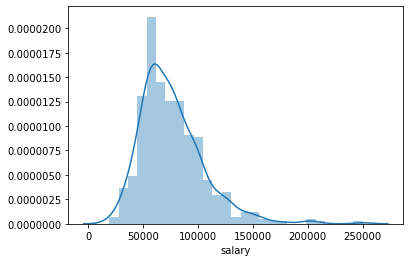

In [24]:
sns.distplot(df.salary)

In [25]:
df.salary.mean()

76407.04631578947

In [26]:
df.salary.median()

71200.0

In [27]:
#Creating a binary variable whether the salary is lower or higher than median

salary_high_low = df.salary.map(lambda x: 1 if x >= df.salary.median() else 0)

In [28]:
df['salary_high_low'] = salary_high_low

In [29]:
#Baseline Accuracy of the model

print('Baseline accuracy:',df.salary_high_low.value_counts(normalize = True).max())

Baseline accuracy: 0.5010526315789474


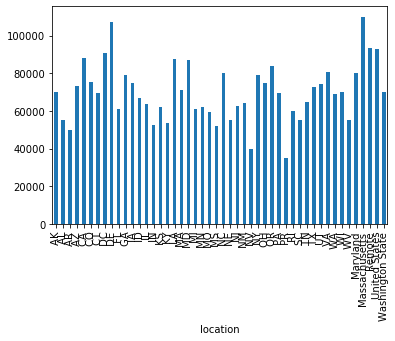

In [30]:
#Classification of model based on location as a feature

df.groupby('location').salary.mean().plot(kind = 'bar');

In [31]:
X = pd.get_dummies(df.location)
y = df.salary_high_low

In [32]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV

In [33]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)

In [34]:
scaler = StandardScaler()

In [35]:
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

X_train = pd.DataFrame(X_train, columns = X.columns)
X_test = pd.DataFrame(X_test, columns = X.columns)

## LogisticRegression

In [36]:
# Setting up grid search with LogisticRegression model

lr = LogisticRegression()

lr_params = {'C': np.logspace(-4, 4, 10),
          'penalty': ['l1', 'l2'],
          'fit_intercept': [True, False],
          'solver': ['liblinear','lbfgs', 'saga']}

gs_lr = GridSearchCV(estimator=lr,
                     param_grid=lr_params,
                     cv=5,
                     verbose = 2,
                    n_jobs = 1)

In [37]:
gs_lr.fit(X_train,y_train)

Fitting 5 folds for each of 120 candidates, totalling 600 fits
[CV] C=0.0001, fit_intercept=True, penalty=l1, solver=liblinear ......
[CV]  C=0.0001, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=0.0001, fit_intercept=True, penalty=l1, solver=liblinear ......
[CV]  C=0.0001, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=0.0001, fit_intercept=True, penalty=l1, solver=liblinear ......
[CV]  C=0.0001, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=0.0001, fit_intercept=True, penalty=l1, solver=liblinear ......
[CV]  C=0.0001, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=0.0001, fit_intercept=True, penalty=l1, solver=liblinear ......
[CV]  C=0.0001, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=0.0001, fit_intercept=True, penalty=l1, solver=lbfgs ..........
[CV]  C=0.0001, fit_intercept=True, penalty=l1, solver=lbfgs, total=   0.0s
[CV] C=0.0001, fit_intercept=True, 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)


[CV]  C=0.0001, fit_intercept=False, penalty=l1, solver=saga, total=   0.0s
[CV] C=0.0001, fit_intercept=False, penalty=l2, solver=liblinear .....
[CV]  C=0.0001, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=0.0001, fit_intercept=False, penalty=l2, solver=liblinear .....
[CV]  C=0.0001, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=0.0001, fit_intercept=False, penalty=l2, solver=liblinear .....
[CV]  C=0.0001, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=0.0001, fit_intercept=False, penalty=l2, solver=liblinear .....
[CV]  C=0.0001, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=0.0001, fit_intercept=False, penalty=l2, solver=liblinear .....
[CV]  C=0.0001, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=0.0001, fit_intercept=False, penalty=l2, solver=lbfgs .........
[CV]  C=0.0001, fit_intercept=False, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=0.0001, f

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)



[CV]  C=0.000774263682681127, fit_intercept=True, penalty=l2, solver=saga, total=   0.0s
[CV] C=0.000774263682681127, fit_intercept=True, penalty=l2, solver=saga 
[CV]  C=0.000774263682681127, fit_intercept=True, penalty=l2, solver=saga, total=   0.0s
[CV] C=0.000774263682681127, fit_intercept=True, penalty=l2, solver=saga 
[CV]  C=0.000774263682681127, fit_intercept=True, penalty=l2, solver=saga, total=   0.0s
[CV] C=0.000774263682681127, fit_intercept=True, penalty=l2, solver=saga 
[CV]  C=0.000774263682681127, fit_intercept=True, penalty=l2, solver=saga, total=   0.0s
[CV] C=0.000774263682681127, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=0.000774263682681127, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=0.000774263682681127, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=0.000774263682681127, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=0.000774263682681127, fit_intercept=False, penalty=l1, solver=li

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)


[CV]  C=0.005994842503189409, fit_intercept=False, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=0.005994842503189409, fit_intercept=False, penalty=l2, solver=saga 
[CV]  C=0.005994842503189409, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=0.005994842503189409, fit_intercept=False, penalty=l2, solver=saga 
[CV]  C=0.005994842503189409, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=0.005994842503189409, fit_intercept=False, penalty=l2, solver=saga 
[CV]  C=0.005994842503189409, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=0.005994842503189409, fit_intercept=False, penalty=l2, solver=saga 
[CV]  C=0.005994842503189409, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=0.005994842503189409, fit_intercept=False, penalty=l2, solver=saga 
[CV]  C=0.005994842503189409, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=0.046415888336127774, fit_intercept=True, penalty=l1, solver=liblinear 
[CV] 

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)



[CV] C=0.046415888336127774, fit_intercept=True, penalty=l2, solver=saga 
[CV]  C=0.046415888336127774, fit_intercept=True, penalty=l2, solver=saga, total=   0.0s
[CV] C=0.046415888336127774, fit_intercept=True, penalty=l2, solver=saga 
[CV]  C=0.046415888336127774, fit_intercept=True, penalty=l2, solver=saga, total=   0.0s
[CV] C=0.046415888336127774, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=0.046415888336127774, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=0.046415888336127774, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=0.046415888336127774, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=0.046415888336127774, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=0.046415888336127774, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=0.046415888336127774, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=0.046415888336127774, fit_intercept=False, penalty=l1, solve

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)



[CV] C=0.046415888336127774, fit_intercept=False, penalty=l2, solver=saga 
[CV]  C=0.046415888336127774, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=0.046415888336127774, fit_intercept=False, penalty=l2, solver=saga 
[CV]  C=0.046415888336127774, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=0.046415888336127774, fit_intercept=False, penalty=l2, solver=saga 
[CV]  C=0.046415888336127774, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=0.046415888336127774, fit_intercept=False, penalty=l2, solver=saga 
[CV]  C=0.046415888336127774, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=0.046415888336127774, fit_intercept=False, penalty=l2, solver=saga 
[CV]  C=0.046415888336127774, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=0.3593813663804626, fit_intercept=True, penalty=l1, solver=liblinear 
[CV]  C=0.3593813663804626, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] 

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)



[CV] C=0.3593813663804626, fit_intercept=True, penalty=l1, solver=saga 
[CV]  C=0.3593813663804626, fit_intercept=True, penalty=l1, solver=saga, total=   0.0s
[CV] C=0.3593813663804626, fit_intercept=True, penalty=l1, solver=saga 
[CV]  C=0.3593813663804626, fit_intercept=True, penalty=l1, solver=saga, total=   0.0s
[CV] C=0.3593813663804626, fit_intercept=True, penalty=l2, solver=liblinear 
[CV]  C=0.3593813663804626, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=0.3593813663804626, fit_intercept=True, penalty=l2, solver=liblinear 
[CV]  C=0.3593813663804626, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=0.3593813663804626, fit_intercept=True, penalty=l2, solver=liblinear 
[CV]  C=0.3593813663804626, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=0.3593813663804626, fit_intercept=True, penalty=l2, solver=liblinear 
[CV]  C=0.3593813663804626, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] 

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  C=0.3593813663804626, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=0.3593813663804626, fit_intercept=False, penalty=l2, solver=saga 
[CV]  C=0.3593813663804626, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=0.3593813663804626, fit_intercept=False, penalty=l2, solver=saga 
[CV]  C=0.3593813663804626, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=0.3593813663804626, fit_intercept=False, penalty=l2, solver=saga 
[CV]  C=0.3593813663804626, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=True, penalty=l1, solver=liblinear 
[CV]  C=2.782559402207126, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=True, penalty=l1, solver=liblinear 
[CV]  C=2.782559402207126, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=True, penalty=l1, solver=liblinear 
[CV]  C=2.782559402

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages

[CV]  C=2.782559402207126, fit_intercept=True, penalty=l1, solver=saga, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=True, penalty=l1, solver=saga 
[CV]  C=2.782559402207126, fit_intercept=True, penalty=l1, solver=saga, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=True, penalty=l1, solver=saga 
[CV]  C=2.782559402207126, fit_intercept=True, penalty=l1, solver=saga, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=True, penalty=l2, solver=liblinear 
[CV]  C=2.782559402207126, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=True, penalty=l2, solver=liblinear 
[CV]  C=2.782559402207126, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=True, penalty=l2, solver=liblinear 
[CV]  C=2.782559402207126, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=True, penalty=l2, solver=liblinear 
[CV]  C=2.7825594022071

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did 

[CV]  C=2.782559402207126, fit_intercept=True, penalty=l2, solver=saga, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=True, penalty=l2, solver=saga 
[CV]  C=2.782559402207126, fit_intercept=True, penalty=l2, solver=saga, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=2.782559402207126, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=2.782559402207126, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=2.782559402207126, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=2.782559402207126, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages

[CV]  C=2.782559402207126, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=False, penalty=l2, solver=liblinear 
[CV]  C=2.782559402207126, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=False, penalty=l2, solver=liblinear 
[CV]  C=2.782559402207126, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=False, penalty=l2, solver=liblinear 
[CV]  C=2.782559402207126, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=False, penalty=l2, solver=liblinear 
[CV]  C=2.782559402207126, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=False, penalty=l2, solver=lbfgs 
[CV]  C=2.782559402207126, fit_intercept=False, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=False, penalty=l2, solver=lbfgs

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did 

[CV]  C=2.782559402207126, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=True, penalty=l1, solver=liblinear 
[CV]  C=21.54434690031882, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=True, penalty=l1, solver=liblinear 
[CV]  C=21.54434690031882, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=True, penalty=l1, solver=liblinear 
[CV]  C=21.54434690031882, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=True, penalty=l1, solver=liblinear 
[CV]  C=21.54434690031882, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=True, penalty=l1, solver=liblinear 
[CV]  C=21.54434690031882, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=True, penalty=l1, solver=lbfgs 
[CV]  

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did 

[CV]  C=21.54434690031882, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=True, penalty=l2, solver=liblinear 
[CV]  C=21.54434690031882, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=True, penalty=l2, solver=liblinear 
[CV]  C=21.54434690031882, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=True, penalty=l2, solver=liblinear 
[CV]  C=21.54434690031882, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=True, penalty=l2, solver=liblinear 
[CV]  C=21.54434690031882, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=True, penalty=l2, solver=lbfgs 
[CV]  C=21.54434690031882, fit_intercept=True, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=True, penalty=l2, solver=lbfgs 
[CV]  C=21

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages

[CV]  C=21.54434690031882, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=21.54434690031882, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=21.54434690031882, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=21.54434690031882, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=False, penalty=l1, solver=lbfgs 
[CV]  C=21.54434690031882, fit_intercept=False, penalty=l1, solver=lbfgs, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=False, penalty=l1, solver=lbfgs 
[CV]  C=21.54434690031882, fit_intercept=False, penalty=l1, solver=lbfgs, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=False, penalty=l1, solver=lbfgs 
[CV]  

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did 

[CV]  C=21.54434690031882, fit_intercept=False, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=False, penalty=l2, solver=lbfgs 
[CV]  C=21.54434690031882, fit_intercept=False, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=False, penalty=l2, solver=lbfgs 
[CV]  C=21.54434690031882, fit_intercept=False, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=False, penalty=l2, solver=lbfgs 
[CV]  C=21.54434690031882, fit_intercept=False, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=False, penalty=l2, solver=saga 
[CV]  C=21.54434690031882, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=False, penalty=l2, solver=saga 
[CV]  C=21.54434690031882, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=False, penalty=l2, solver=saga 
[CV]  C=21.54434690031882, fit_intercep

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  C=166.81005372000558, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=True, penalty=l1, solver=liblinear 
[CV]  C=166.81005372000558, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=True, penalty=l1, solver=liblinear 
[CV]  C=166.81005372000558, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=True, penalty=l1, solver=liblinear 
[CV]  C=166.81005372000558, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=True, penalty=l1, solver=lbfgs 
[CV]  C=166.81005372000558, fit_intercept=True, penalty=l1, solver=lbfgs, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=True, penalty=l1, solver=lbfgs 
[CV]  C=166.81005372000558, fit_intercept=True, penalty=l1, solver=lbfgs, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=True, penalty=l1, solver=lbfgs 
[CV]  

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did 

[CV]  C=166.81005372000558, fit_intercept=True, penalty=l1, solver=saga, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=True, penalty=l2, solver=liblinear 
[CV]  C=166.81005372000558, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=True, penalty=l2, solver=liblinear 
[CV]  C=166.81005372000558, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=True, penalty=l2, solver=liblinear 
[CV]  C=166.81005372000558, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=True, penalty=l2, solver=liblinear 
[CV]  C=166.81005372000558, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=True, penalty=l2, solver=liblinear 
[CV]  C=166.81005372000558, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=True, penalty=l2, solver=lb

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this tra

[CV]  C=166.81005372000558, fit_intercept=True, penalty=l2, solver=saga, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=166.81005372000558, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=166.81005372000558, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=166.81005372000558, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=166.81005372000558, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=166.81005372000558, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=False, penalty=l1

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did 

[CV]  C=166.81005372000558, fit_intercept=False, penalty=l1, solver=saga, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=False, penalty=l1, solver=saga 
[CV]  C=166.81005372000558, fit_intercept=False, penalty=l1, solver=saga, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=False, penalty=l2, solver=liblinear 
[CV]  C=166.81005372000558, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=False, penalty=l2, solver=liblinear 
[CV]  C=166.81005372000558, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=False, penalty=l2, solver=liblinear 
[CV]  C=166.81005372000558, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=False, penalty=l2, solver=liblinear 
[CV]  C=166.81005372000558, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=False, penalty=l2, solver=

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did 

[CV]  C=166.81005372000558, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=False, penalty=l2, solver=saga 
[CV]  C=166.81005372000558, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=False, penalty=l2, solver=saga 
[CV]  C=166.81005372000558, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=False, penalty=l2, solver=saga 
[CV]  C=166.81005372000558, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=True, penalty=l1, solver=liblinear 
[CV]  C=1291.5496650148827, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.1s
[CV] C=1291.5496650148827, fit_intercept=True, penalty=l1, solver=liblinear 
[CV]  C=1291.5496650148827, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=True, penalty=l1, solver=liblinear 
[CV]  C=1291.5

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages

[CV]  C=1291.5496650148827, fit_intercept=True, penalty=l1, solver=saga, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=True, penalty=l1, solver=saga 
[CV]  C=1291.5496650148827, fit_intercept=True, penalty=l1, solver=saga, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=True, penalty=l1, solver=saga 
[CV]  C=1291.5496650148827, fit_intercept=True, penalty=l1, solver=saga, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=True, penalty=l2, solver=liblinear 
[CV]  C=1291.5496650148827, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=True, penalty=l2, solver=liblinear 
[CV]  C=1291.5496650148827, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=True, penalty=l2, solver=liblinear 
[CV]  C=1291.5496650148827, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=True, penalty=l2, solver=liblinear 
[CV]  C=129

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did 

[CV]  C=1291.5496650148827, fit_intercept=True, penalty=l2, solver=saga, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=True, penalty=l2, solver=saga 
[CV]  C=1291.5496650148827, fit_intercept=True, penalty=l2, solver=saga, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=1291.5496650148827, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=1291.5496650148827, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=1291.5496650148827, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=1291.5496650148827, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=False, penalty=l1, solver=lib

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  C=1291.5496650148827, fit_intercept=False, penalty=l1, solver=saga, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=False, penalty=l2, solver=liblinear 
[CV]  C=1291.5496650148827, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=False, penalty=l2, solver=liblinear 
[CV]  C=1291.5496650148827, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=False, penalty=l2, solver=liblinear 
[CV]  C=1291.5496650148827, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=False, penalty=l2, solver=liblinear 
[CV]  C=1291.5496650148827, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=False, penalty=l2, solver=liblinear 
[CV]  C=1291.5496650148827, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=False, penalty=l

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this tra

[CV]  C=1291.5496650148827, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=False, penalty=l2, solver=saga 
[CV]  C=1291.5496650148827, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=10000.0, fit_intercept=True, penalty=l1, solver=liblinear .....
[CV]  C=10000.0, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=10000.0, fit_intercept=True, penalty=l1, solver=liblinear .....
[CV]  C=10000.0, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=10000.0, fit_intercept=True, penalty=l1, solver=liblinear .....
[CV]  C=10000.0, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=10000.0, fit_intercept=True, penalty=l1, solver=liblinear .....
[CV]  C=10000.0, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=10000.0, fit_intercept=True, penalty=l1, solver=liblinear .....
[CV]  C=10000.0, fit_intercept=True, penalty=l1, solver=liblinear, total

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did 

[CV]  C=10000.0, fit_intercept=True, penalty=l1, solver=saga, total=   0.0s
[CV] C=10000.0, fit_intercept=True, penalty=l2, solver=liblinear .....
[CV]  C=10000.0, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=10000.0, fit_intercept=True, penalty=l2, solver=liblinear .....
[CV]  C=10000.0, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=10000.0, fit_intercept=True, penalty=l2, solver=liblinear .....
[CV]  C=10000.0, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=10000.0, fit_intercept=True, penalty=l2, solver=liblinear .....
[CV]  C=10000.0, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=10000.0, fit_intercept=True, penalty=l2, solver=liblinear .....
[CV]  C=10000.0, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=10000.0, fit_intercept=True, penalty=l2, solver=lbfgs .........
[CV]  C=10000.0, fit_intercept=True, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=10000.0, 

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this tra

[CV]  C=10000.0, fit_intercept=True, penalty=l2, solver=saga, total=   0.0s
[CV] C=10000.0, fit_intercept=False, penalty=l1, solver=liblinear ....
[CV]  C=10000.0, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=10000.0, fit_intercept=False, penalty=l1, solver=liblinear ....
[CV]  C=10000.0, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=10000.0, fit_intercept=False, penalty=l1, solver=liblinear ....
[CV]  C=10000.0, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=10000.0, fit_intercept=False, penalty=l1, solver=liblinear ....
[CV]  C=10000.0, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=10000.0, fit_intercept=False, penalty=l1, solver=liblinear ....
[CV]  C=10000.0, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=10000.0, fit_intercept=False, penalty=l1, solver=lbfgs ........
[CV]  C=10000.0, fit_intercept=False, penalty=l1, solver=lbfgs, total=   0.0s
[CV] C=100

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did 

[CV]  C=10000.0, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=10000.0, fit_intercept=False, penalty=l2, solver=liblinear ....
[CV]  C=10000.0, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=10000.0, fit_intercept=False, penalty=l2, solver=liblinear ....
[CV]  C=10000.0, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=10000.0, fit_intercept=False, penalty=l2, solver=liblinear ....
[CV]  C=10000.0, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=10000.0, fit_intercept=False, penalty=l2, solver=liblinear ....
[CV]  C=10000.0, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=10000.0, fit_intercept=False, penalty=l2, solver=lbfgs ........
[CV]  C=10000.0, fit_intercept=False, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=10000.0, fit_intercept=False, penalty=l2, solver=lbfgs ........
[CV]  C=10000.0, fit_intercept=False, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=1

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    6.0s finished


GridSearchCV(cv=5, error_score=nan,
             estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                          fit_intercept=True,
                                          intercept_scaling=1, l1_ratio=None,
                                          max_iter=100, multi_class='auto',
                                          n_jobs=None, penalty='l2',
                                          random_state=None, solver='lbfgs',
                                          tol=0.0001, verbose=0,
                                          warm_start=False),
             iid='deprecated', n_jobs=1,
             param_grid={'C': array([1.00000000e-04, 7.74263683e-04, 5.99484250e-03, 4.64158883e-02,
       3.59381366e-01, 2.78255940e+00, 2.15443469e+01, 1.66810054e+02,
       1.29154967e+03, 1.00000000e+04]),
                         'fit_intercept': [True, False],
                         'penalty': ['l1', 'l2'],
                         'solver': 

In [38]:
#Extracting grid search results

print('Best Parameters:')
print(gs_lr.best_params_)
print('Best estimator C:')
print(gs_lr.best_estimator_.C)
print('Best estimator mean cross validated training score:')
print(gs_lr.best_score_)
print('Best estimator score on the full training set:')
print(gs_lr.score(X_train, y_train))
print('Best estimator score on the test set:')
print(gs_lr.score(X_test, y_test))
print('Best estimator coefficients:')
print(gs_lr.best_estimator_.coef_)

Best Parameters:
{'C': 0.3593813663804626, 'fit_intercept': True, 'penalty': 'l1', 'solver': 'liblinear'}
Best estimator C:
0.3593813663804626
Best estimator mean cross validated training score:
0.5710526315789475
Best estimator score on the full training set:
0.6473684210526316
Best estimator score on the test set:
0.5052631578947369
Best estimator coefficients:
[[ 0.         -0.08185146 -0.0818526   0.          0.24714564  0.
  -0.23846096  0.28822768  0.17406415 -0.12793415 -0.05966861  0.
   0.          0.03102322 -0.01487616 -0.08185264 -0.3165038   0.
  -0.00794405  0.11342572  0.          0.         -0.23846118 -0.14307444
   0.         -0.08185146 -0.06609476 -0.01487579 -0.08185241  0.0809618
   0.          0.          0.03148425 -0.08185301 -0.0818532  -0.01487465
   0.         -0.00616163  0.03641952  0.          0.00663371  0.
  -0.01487742  0.10207295  0.10207299  0.30910868  0.0455985   0.        ]]


In [39]:
pd.DataFrame(gs_lr.best_estimator_.coef_, columns = [X_train.columns], index = ['coeff']).T.sort_values('coeff', ascending = False)

,coeff
Remote,0.309109
DC,0.288228
CA,0.247146
DE,0.174064
MD,0.113426
Massachusetts,0.102073
Maryland,0.102073
NY,0.080962
United States,0.045598
UT,0.036420


## DecisionTree

In [40]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier

In [41]:
# Setting up grid search with DecisionTree model

dtc = DecisionTreeClassifier()

dtc_params = {
    'max_depth': list(range(1, 10))+[None],
    'criterion': ['gini', 'entropy'],
    'max_features': list(range(1, 10))+[None],
    'min_samples_split': [2, 3, 4, 5, 10, 15, 20, 25, 30, 40, 50],
    'ccp_alpha': [0, 0.001, 0.005, 0.01]
}


gs_dtc = GridSearchCV(dtc, dtc_params, cv=5, verbose=2, n_jobs=1)

In [42]:
gs_dtc.fit(X_train, y_train)

Fitting 5 folds for each of 8800 candidates, totalling 44000 fits
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, c

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=2, min_samples_split=3, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=3, min_samples_split=4, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=4, min_samples_split=5, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=5, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=6, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=7, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=8, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=9, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=

[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=1, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=3, min_samples_split=3, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=4, min_samples_split=4, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=5, min_samples_split=5, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=6, min_samples_spli

[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=7, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=8, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=9, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=

[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=1, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=3, min_samples_split=3, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=4, min_samples_split=4, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=5, min_samples_split=10

[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=6, min_samples_

[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=7, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=8, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=9, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=

[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=1, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=3, min_samples_sp

[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=4, min_samples_split=3, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=5, min_samples_split=4, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=6, min_samples_split=5, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=7, min_samples_sp

[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=8, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=9, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=

[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=1, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=1, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=1, min_samples_

[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=2, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=3, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=5, min_samples_

[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=5, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=6, min_samples_split=

[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=7, min_samples_split=4, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=8, min_samples_split=5, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=9, min_samples_split=

[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=1, min_samples_

[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=2, min_samples

[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=3, min_samples_

[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=4, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=5, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=6, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=7, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=9, min_samples_split=

[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_fea

[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=1, min_samples_split=3, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=2, min_samples_split=4, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=3, min_samples_split=5, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=4, min_samples_spli

[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=5, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=6, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=7, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=8, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=9, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=

[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=1, min_samples_

[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=2, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=3, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=5, min_samples_sp

[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=6, min_samples_split=3, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=7, min_samples_split=4, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=8, min_samples_split=4, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=9, min_samples_split=5, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_fe

[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=1, min_samples_split=10

[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=2, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=3, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=4, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=5, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=6, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=7, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=9, min_samples_spli

[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_fea

[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max

[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_

[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_

[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_

[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_

[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_

[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_

[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max

[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_

[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0, criter

[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_

[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_f

[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=

[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=en

[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max

[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=en

[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_dept

[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_d

[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4,

[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_dept

[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_dept

[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0, criter

[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=

[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_dept

[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=None, min_samples_split=50 
[CV]  ccp_alpha

[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, m

[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, m

[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, m

[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6,

[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0, criterio

[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entrop

[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7,

[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=None, min_samples_split=30 
[CV]  ccp_alpha

[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=None, min_samples_split=15 
[CV]  ccp_alpha

[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9,

[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_dept

[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=None, min_samples_split=25 
[CV]  ccp_alpha

[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=1, min_samples_split=30 
[CV]  ccp_alpha

[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=2, min_samples_split=30 
[CV]  ccp_alpha

[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=3, min_samples_split=30 
[CV]  ccp_alpha

[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=

[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=5, min_samples_split=30 
[CV]  ccp_alpha

[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=6, min_samples_split=30 
[CV]  ccp_alpha

[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=7, min_samples_split=30 
[CV]  ccp_alpha

[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=8, min_samples_split=30 
[CV]  ccp_alpha

[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=9, min_samples_split=25 
[CV]  ccp_alpha

[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=None, min_sam

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=1, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=1, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=1, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=1, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=1, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gi

[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gin

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, ma

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini,

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini,

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=None, min_samples_split=15 
[CV] 

[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=1, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=1, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=1, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=1, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=1, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=1, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=1, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=1, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=1, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=1, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gin

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_d

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=None, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=None, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.001

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=None, min_samples_split=10 
[CV]  

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=1, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=1, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=1, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini,

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=None, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, ma

[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_dep

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=None, min_samples_split=10 
[CV]  ccp_alph

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_dep

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_d

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_d

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=None, min_samples_split=4 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=1, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=2, min_samples_split=4 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=2, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=3, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=4, min_samples_split=40 
[CV] 

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=5, min_samples_split=40 
[CV] 

[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=6, min_samples_split=30, total=   0.0s
[CV] 

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=7, min_samples_split=25 
[CV] 

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=8, min_samples_split=30 
[CV] 

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=9, min_samples_split=30 
[CV] 

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=Non

[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=2, min_samples_split=10 
[CV]  ccp_al

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=3, min_samples_split=15 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=4, min_samples_split=15 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=5, min_samples_split=15 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=6, min_samples_split=20 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=7, min_samples_split=25 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=8, min_samples_split=30 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=9, min_samples_split=40 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=Non

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=2, min_samples_split=2 
[CV]  ccp_

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=3, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=4, min_samples_split=4 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=5, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=5, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=5, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=6, min_samples_split=2 
[CV]  ccp_

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=7, min_samples_split=2 
[CV]  ccp_al

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=8, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=9, min_samples_split=4 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=None, min_sa

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=1, min_samples_split=10 
[CV]  ccp_

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=2, min_samples_split=10 
[CV]  ccp_

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=3, min_samples_split=15 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=4, min_samples_split=15 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=5, min_samples_split=20 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=6, min_samples_split=25 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=7, min_samples_split=30 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=8, min_samples_split=40 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=9, min_samples_split=40 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=Non

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=1, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=3, min_samples_split=2 
[CV]  ccp_al

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=4, min_samples_split=4 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=5, min_samples_split=5 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=6, min_samples_split=10 
[CV]  cc

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=7, min_samples_split=15 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=8, min_samples_split=15 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=9, min_samples_split=20 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=Non

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=1, min_samples_split=30 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=2, min_samples_split=40 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=3, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=5, min_samples_split=2 
[CV]  ccp_

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=6, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=7, min_samples_split=4 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=8, min_samples_split=10 
[CV]  ccp_alph

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=9, min_samples_split=15 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=Non

[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=1, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=1, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=1, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=1, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=1, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=1, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=1, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=1, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=1, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=1, min_samples_split=20, total=   0.0s
[CV] 

[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=2, min_samples_split=25, total=   0.0s
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=3, min_samples_split=30 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=4, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=5, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=5, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=5, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=6, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=8, min_samples_split=2 
[CV]  ccp_alph

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=9, min_samples_split=4 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=None, min_sa

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=1, min_samples_split=4 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=2, min_samples_split=2 
[CV]  

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=2, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=4, min_samples_split=2 
[CV]  ccp_alph

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=5, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=8, min_samples_split=2 
[CV]  ccp_

[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=

[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=None, min_samples_split=2, tot

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=1, min_samples_split=2 
[CV

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=2, min_samples_split=2 
[CV]  ccp_alph

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=3, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=4, min_samples_split=4 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=5, min_samples_split=5 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=6, min_samples_split=5 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=7, min_samples_split=5 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=8, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=9, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=None, min_sa

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=1, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=2, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=3, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=4, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=5, min_samples_split=4 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=6, min_samples_split=5 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=7, min_samples_split=10 
[CV]  ccp_al

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=8, min_samples_split=10 
[CV]  

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=9, min_samples_split=15 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=Non

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, ma

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_d

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, m

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=None, min_samples_split=5 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, m

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=None, min_samples_split=5 
[CV]  ccp_alpha

[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_d

[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gin

[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gin

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=None, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, m

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gin

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=None, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, m

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gi

[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gin

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.005, cr

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini,

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gi

[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gin

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=None, min_samples_split=30 
[CV] 

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini,

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_d

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=None, min_samples_split=20 
[CV] 

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=1, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=1, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=1, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=1, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=1, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=5, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=5, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, m

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=None, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gin

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini,

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=None, min_samples_split=25 
[CV] 

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=1, min_samples_split=30 
[CV] 

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=2, min_samples_split=40 
[CV] 

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=3, min_samples_split=40 
[CV] 

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=4, min_samples_split=40 
[CV] 

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=5, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=5, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=6, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=8, min_samples_split=2 
[CV]  

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=9, min_samples_split=2 
[CV]  

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=None, min_samples_split=2 
[CV

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=Non

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=1, min_samples_split=40 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=3, min_samples_split=2 
[CV]  

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=4, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=5, min_samples_split=4 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=6, min_samples_split=5 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=7, min_samples_split=10 
[CV]  ccp_al

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=8, min_samples_split=15 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=9, min_samples_split=25 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=Non

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=1, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=2, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=4, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=5, min_samples_split=4 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=6, min_samples_split=5 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=7, min_samples_split=10 
[CV]  

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=8, min_samples_split=20 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=9, min_samples_split=25 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=Non

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=1, min_samples_split=40 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=3, min_samples_split=2 
[CV]  cc

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=4, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=5, min_samples_split=5 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=6, min_samples_split=10 
[CV]  ccp_alph

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=7, min_samples_split=15 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=8, min_samples_split=20 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=9, min_samples_split=10 
[CV]  ccp_al

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=None

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=1, min_samples_split=10 
[CV]  cc

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=2, min_samples_split=15 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=3, min_samples_split=20 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=4, min_samples_split=25 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=5, min_samples_split=30 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=6, min_samples_split=30 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=7, min_samples_split=25 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=8, min_samples_split=30 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=9, min_samples_split=40 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=Non

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=1, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=3, min_samples_split=2 
[CV]  ccp_alph

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=4, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=5, min_samples_split=4 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=6, min_samples_split=10 
[CV]  ccp_alph

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=7, min_samples_split=15 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=8, min_samples_split=20 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=9, min_samples_split=25 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=Non

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=1, min_samples_split=40 
[CV] 

[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=2, min_samples_split=40, total=   0.0s
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=4, min_samples_split=2 
[CV]  

[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=6, min_samples_split=4 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=7, min_samples_split=5 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=8, min_samples_split=10 
[CV]  cc

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=9, min_samples_split=15 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=Non

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=1, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=1, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=1, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=1, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=1, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=1, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=1, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=1, min_samples_split=25 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=2, min_samples_split=30 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=3, min_samples_split=40 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=4, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=5, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=6, min_samples_split=2 
[CV]  ccp_al

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=7, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=8, min_samples_split=4 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=9, min_samples_split=5 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=None, min_sa

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=1, min_samples_split=10 
[CV]  ccp_al

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=2, min_samples_split=15 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=3, min_samples_split=20 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=4, min_samples_split=25 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=5, min_samples_split=30 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=6, min_samples_split=40 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=7, min_samples_split=40 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=8, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=None, min_samples_spli

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=1, min_samples_spli

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=2, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=3, min_samples_split=4 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=4, min_samples_split=5 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=5, min_samples_split=10 
[CV]  ccp_alph

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=6, min_samples_split=5 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=7, min_samples_split=10 
[CV]  ccp_al

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=8, min_samples_split=10 
[CV]  ccp_

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=9, min_samples_split=15 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=None, min_sa

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=1, min_sa

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=2, min_sa

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=3, min_sa

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=4, min_sa

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=5, min_sa

[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=6, min_samples_split=5,

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=7, min_sa

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=8, min_sa

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=9, min_sa

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=N

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_de

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=None, min_samples_split=30 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2,

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, m

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=None, min_samples_split=20 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=1, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=1, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=1, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_dept

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=1, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=1, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=1, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=1, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=1, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_dept

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5,

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5,

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, m

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=None, min_samples_split=50 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7,

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=None, min_samples_split=25 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_dept

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=None, min_samples_split=15 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=1, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=1, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=1, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=1, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=1, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=1, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=1, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=1, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=1, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=1, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_dept

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.01

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=2, min_samples_split=20 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.01, 

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=5, min_samples_split=15 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.01, cr

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=8, min_samples_split=20 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=9, min_samples_split=15 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=None, min_samp

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=2, min_samples_split=15 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=3, min_samples_split=20 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=4, min_samples_split=25 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=5, min_samples_split=40 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=6, min_samples_split=50 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.01, cr

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=None, min_samples_spli

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=3, min_samples_split=15 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=4, min_samples_split=25 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=5, min_samples_split=30 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=6, min_samples_split=40 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=7, min_samples_split=40 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=8, min_samples_split=40 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=9, min_samples_split=40 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=None, min_sam

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=1, min_samples_split=50 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=2, min_samples_split=50 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.01

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=None, min_samples_spli

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.01, cri

[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=3, min_samples_split=20 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=4, min_samples_split=20 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=5, min_samples_split=25 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=6, min_samples_split=30 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=7, min_samples_split=40 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=8, min_samples_split=50 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=None, min_samples_split=2 
[CV]  ccp

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=1, min_samples_split=2 
[CV] 

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.01, cr

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=None, min_samples_spli

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.01, 

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=4, min_samples_split=15 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=5, min_samples_split=20 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=6, min_samples_split=25 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=7, min_samples_split=30 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=8, min_samples_split=30 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=9, min_samples_split=30 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=None, min_sam

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=1, min_samples_split=40 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=2, min_samples_split=40 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=3, min_samples_split=40 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.01, cr

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.01, cr

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=None, min_sample

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=1, min_samples_split=15 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=2, min_samples_split=20 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=3, min_samples_split=25 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=4, min_samples_split=30 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=5, min_samples_split=40 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=6, min_samples_split=50 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=None, min_samples_spli

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=5, min_samples_split=15 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=6, min_samples_split=25 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=7, min_samples_split=25 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=8, min_samples_split=30 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=9, min_samples_split=40 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=None, min_sam

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=1, min_sam

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=2, min_sam

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=3, min_sam

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=4, min_sam

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=5, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=5, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=5, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=6, min_sampl

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=7, min_samples

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=8, min_samples_s

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=9, min_samples_s

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_fea

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=No

[Parallel(n_jobs=1)]: Done 44000 out of 44000 | elapsed:  2.4min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=1,
             param_grid={'ccp_alpha': [0, 0.001, 0.005, 0.01],
                  

In [43]:
gs_dtc.best_estimator_

DecisionTreeClassifier(ccp_alpha=0.001, class_weight=None, criterion='entropy',
                       max_depth=9, max_features=7, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=30,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [44]:
#Extracting grid search results

print('Best Parameters:')
print(gs_dtc.best_params_)
print('Best estimator mean cross validated training score:')
print(gs_dtc.best_score_)
print('Best estimator score on the full training set:')
print(gs_dtc.score(X_train, y_train))
print('Best estimator score on the test set:')
print(gs_dtc.score(X_test, y_test))

Best Parameters:
{'ccp_alpha': 0.001, 'criterion': 'entropy', 'max_depth': 9, 'max_features': 7, 'min_samples_split': 30}
Best estimator mean cross validated training score:
0.6078947368421053
Best estimator score on the full training set:
0.5552631578947368
Best estimator score on the test set:
0.5368421052631579


## RandomForest

In [45]:
from sklearn.ensemble import RandomForestClassifier

In [46]:
# setting up grid search with RandomForest model

rfc = RandomForestClassifier()

rfc_params = {'max_depth':range(1,20),
          'max_features':["auto","log2",0.5, 0.8],
         'criterion':['gini','entropy'],
         'bootstrap':[True,False]}

gs_rfc = GridSearchCV(estimator=rfc,
                     param_grid=rfc_params,
                     cv=5,
                     verbose = 2,
                    n_jobs = 1)

In [47]:
gs_rfc.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 5 folds for each of 304 candidates, totalling 1520 fits
[CV] bootstrap=True, criterion=gini, max_depth=1, max_features=auto ..
[CV]  bootstrap=True, criterion=gini, max_depth=1, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=1, max_features=auto ..


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


[CV]  bootstrap=True, criterion=gini, max_depth=1, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=1, max_features=auto ..
[CV]  bootstrap=True, criterion=gini, max_depth=1, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=1, max_features=auto ..
[CV]  bootstrap=True, criterion=gini, max_depth=1, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=1, max_features=auto ..
[CV]  bootstrap=True, criterion=gini, max_depth=1, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=1, max_features=log2 ..
[CV]  bootstrap=True, criterion=gini, max_depth=1, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=1, max_features=log2 ..
[CV]  bootstrap=True, criterion=gini, max_depth=1, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=1, max_features=log2 ..
[CV]  bootstrap=True, criterion=gini, max_depth=1, max_features=log2, 

[CV]  bootstrap=True, criterion=gini, max_depth=3, max_features=0.8, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=3, max_features=0.8 ...
[CV]  bootstrap=True, criterion=gini, max_depth=3, max_features=0.8, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=3, max_features=0.8 ...
[CV]  bootstrap=True, criterion=gini, max_depth=3, max_features=0.8, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=3, max_features=0.8 ...
[CV]  bootstrap=True, criterion=gini, max_depth=3, max_features=0.8, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=3, max_features=0.8 ...
[CV]  bootstrap=True, criterion=gini, max_depth=3, max_features=0.8, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=4, max_features=auto ..
[CV]  bootstrap=True, criterion=gini, max_depth=4, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=4, max_features=auto ..
[CV]  bootstrap=True, criterion=gini, max_depth=4, max_features=auto, total

[CV]  bootstrap=True, criterion=gini, max_depth=6, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=6, max_features=0.5 ...
[CV]  bootstrap=True, criterion=gini, max_depth=6, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=6, max_features=0.5 ...
[CV]  bootstrap=True, criterion=gini, max_depth=6, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=6, max_features=0.5 ...
[CV]  bootstrap=True, criterion=gini, max_depth=6, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=6, max_features=0.5 ...
[CV]  bootstrap=True, criterion=gini, max_depth=6, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=6, max_features=0.5 ...
[CV]  bootstrap=True, criterion=gini, max_depth=6, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=6, max_features=0.8 ...
[CV]  bootstrap=True, criterion=gini, max_depth=6, max_features=0.8, total=

[CV]  bootstrap=True, criterion=gini, max_depth=9, max_features=auto, total=   0.2s
[CV] bootstrap=True, criterion=gini, max_depth=9, max_features=auto ..
[CV]  bootstrap=True, criterion=gini, max_depth=9, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=9, max_features=log2 ..
[CV]  bootstrap=True, criterion=gini, max_depth=9, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=9, max_features=log2 ..
[CV]  bootstrap=True, criterion=gini, max_depth=9, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=9, max_features=log2 ..
[CV]  bootstrap=True, criterion=gini, max_depth=9, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=9, max_features=log2 ..
[CV]  bootstrap=True, criterion=gini, max_depth=9, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=9, max_features=log2 ..
[CV]  bootstrap=True, criterion=gini, max_depth=9, max_features=log2, 

[CV]  bootstrap=True, criterion=gini, max_depth=11, max_features=0.8, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=11, max_features=0.8 ..
[CV]  bootstrap=True, criterion=gini, max_depth=11, max_features=0.8, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=11, max_features=0.8 ..
[CV]  bootstrap=True, criterion=gini, max_depth=11, max_features=0.8, total=   0.2s
[CV] bootstrap=True, criterion=gini, max_depth=12, max_features=auto .
[CV]  bootstrap=True, criterion=gini, max_depth=12, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=12, max_features=auto .
[CV]  bootstrap=True, criterion=gini, max_depth=12, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=12, max_features=auto .
[CV]  bootstrap=True, criterion=gini, max_depth=12, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=12, max_features=auto .
[CV]  bootstrap=True, criterion=gini, max_depth=12, max_features=au

[CV]  bootstrap=True, criterion=gini, max_depth=14, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=14, max_features=0.5 ..
[CV]  bootstrap=True, criterion=gini, max_depth=14, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=14, max_features=0.5 ..
[CV]  bootstrap=True, criterion=gini, max_depth=14, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=14, max_features=0.5 ..
[CV]  bootstrap=True, criterion=gini, max_depth=14, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=14, max_features=0.8 ..
[CV]  bootstrap=True, criterion=gini, max_depth=14, max_features=0.8, total=   0.2s
[CV] bootstrap=True, criterion=gini, max_depth=14, max_features=0.8 ..
[CV]  bootstrap=True, criterion=gini, max_depth=14, max_features=0.8, total=   0.2s
[CV] bootstrap=True, criterion=gini, max_depth=14, max_features=0.8 ..
[CV]  bootstrap=True, criterion=gini, max_depth=14, max_features=0.8, 

[CV]  bootstrap=True, criterion=gini, max_depth=17, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=17, max_features=log2 .
[CV]  bootstrap=True, criterion=gini, max_depth=17, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=17, max_features=log2 .
[CV]  bootstrap=True, criterion=gini, max_depth=17, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=17, max_features=log2 .
[CV]  bootstrap=True, criterion=gini, max_depth=17, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=17, max_features=log2 .
[CV]  bootstrap=True, criterion=gini, max_depth=17, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=17, max_features=0.5 ..
[CV]  bootstrap=True, criterion=gini, max_depth=17, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=17, max_features=0.5 ..
[CV]  bootstrap=True, criterion=gini, max_depth=17, max_features=

[CV]  bootstrap=True, criterion=gini, max_depth=19, max_features=0.8, total=   0.2s
[CV] bootstrap=True, criterion=entropy, max_depth=1, max_features=auto 
[CV]  bootstrap=True, criterion=entropy, max_depth=1, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=1, max_features=auto 
[CV]  bootstrap=True, criterion=entropy, max_depth=1, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=1, max_features=auto 
[CV]  bootstrap=True, criterion=entropy, max_depth=1, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=1, max_features=auto 
[CV]  bootstrap=True, criterion=entropy, max_depth=1, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=1, max_features=auto 
[CV]  bootstrap=True, criterion=entropy, max_depth=1, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=1, max_features=log2 
[CV]  bootstrap=True, criterion=entropy, max_dept

[CV]  bootstrap=True, criterion=entropy, max_depth=3, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=3, max_features=0.5 
[CV]  bootstrap=True, criterion=entropy, max_depth=3, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=3, max_features=0.5 
[CV]  bootstrap=True, criterion=entropy, max_depth=3, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=3, max_features=0.5 
[CV]  bootstrap=True, criterion=entropy, max_depth=3, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=3, max_features=0.8 
[CV]  bootstrap=True, criterion=entropy, max_depth=3, max_features=0.8, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=3, max_features=0.8 
[CV]  bootstrap=True, criterion=entropy, max_depth=3, max_features=0.8, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=3, max_features=0.8 
[CV]  bootstrap=True, criterion=entropy, max_depth=3, max_

[CV]  bootstrap=True, criterion=entropy, max_depth=6, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=6, max_features=auto 
[CV]  bootstrap=True, criterion=entropy, max_depth=6, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=6, max_features=log2 
[CV]  bootstrap=True, criterion=entropy, max_depth=6, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=6, max_features=log2 
[CV]  bootstrap=True, criterion=entropy, max_depth=6, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=6, max_features=log2 
[CV]  bootstrap=True, criterion=entropy, max_depth=6, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=6, max_features=log2 
[CV]  bootstrap=True, criterion=entropy, max_depth=6, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=6, max_features=log2 
[CV]  bootstrap=True, criterion=entropy, max_d

[CV]  bootstrap=True, criterion=entropy, max_depth=8, max_features=0.8, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=8, max_features=0.8 
[CV]  bootstrap=True, criterion=entropy, max_depth=8, max_features=0.8, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=8, max_features=0.8 
[CV]  bootstrap=True, criterion=entropy, max_depth=8, max_features=0.8, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=8, max_features=0.8 
[CV]  bootstrap=True, criterion=entropy, max_depth=8, max_features=0.8, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=9, max_features=auto 
[CV]  bootstrap=True, criterion=entropy, max_depth=9, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=9, max_features=auto 
[CV]  bootstrap=True, criterion=entropy, max_depth=9, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=9, max_features=auto 
[CV]  bootstrap=True, criterion=entropy, max_depth=9,

[CV]  bootstrap=True, criterion=entropy, max_depth=11, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=11, max_features=log2 
[CV]  bootstrap=True, criterion=entropy, max_depth=11, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=11, max_features=0.5 
[CV]  bootstrap=True, criterion=entropy, max_depth=11, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=11, max_features=0.5 
[CV]  bootstrap=True, criterion=entropy, max_depth=11, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=11, max_features=0.5 
[CV]  bootstrap=True, criterion=entropy, max_depth=11, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=11, max_features=0.5 
[CV]  bootstrap=True, criterion=entropy, max_depth=11, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=11, max_features=0.5 
[CV]  bootstrap=True, criterion=entropy, ma

[CV]  bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=14, max_features=auto 
[CV]  bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=14, max_features=auto 
[CV]  bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=14, max_features=auto 
[CV]  bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=14, max_features=auto 
[CV]  bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=14, max_features=log2 
[CV]  bootstrap=True, criterion=entropy, max_depth=14, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=14, max_features=log2 
[CV]  bootstrap=True, criterion=en

[CV]  bootstrap=True, criterion=entropy, max_depth=16, max_features=0.5, total=   0.2s
[CV] bootstrap=True, criterion=entropy, max_depth=16, max_features=0.5 
[CV]  bootstrap=True, criterion=entropy, max_depth=16, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=16, max_features=0.8 
[CV]  bootstrap=True, criterion=entropy, max_depth=16, max_features=0.8, total=   0.2s
[CV] bootstrap=True, criterion=entropy, max_depth=16, max_features=0.8 
[CV]  bootstrap=True, criterion=entropy, max_depth=16, max_features=0.8, total=   0.2s
[CV] bootstrap=True, criterion=entropy, max_depth=16, max_features=0.8 
[CV]  bootstrap=True, criterion=entropy, max_depth=16, max_features=0.8, total=   0.2s
[CV] bootstrap=True, criterion=entropy, max_depth=16, max_features=0.8 
[CV]  bootstrap=True, criterion=entropy, max_depth=16, max_features=0.8, total=   0.2s
[CV] bootstrap=True, criterion=entropy, max_depth=16, max_features=0.8 
[CV]  bootstrap=True, criterion=entropy, max_d

[CV]  bootstrap=True, criterion=entropy, max_depth=19, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=19, max_features=log2 
[CV]  bootstrap=True, criterion=entropy, max_depth=19, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=19, max_features=log2 
[CV]  bootstrap=True, criterion=entropy, max_depth=19, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=19, max_features=log2 
[CV]  bootstrap=True, criterion=entropy, max_depth=19, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=19, max_features=log2 
[CV]  bootstrap=True, criterion=entropy, max_depth=19, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=19, max_features=0.5 
[CV]  bootstrap=True, criterion=entropy, max_depth=19, max_features=0.5, total=   0.2s
[CV] bootstrap=True, criterion=entropy, max_depth=19, max_features=0.5 
[CV]  bootstrap=True, criterion=entro

[CV]  bootstrap=False, criterion=gini, max_depth=2, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=2, max_features=0.8 ..
[CV]  bootstrap=False, criterion=gini, max_depth=2, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=3, max_features=auto .
[CV]  bootstrap=False, criterion=gini, max_depth=3, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=3, max_features=auto .
[CV]  bootstrap=False, criterion=gini, max_depth=3, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=3, max_features=auto .
[CV]  bootstrap=False, criterion=gini, max_depth=3, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=3, max_features=auto .
[CV]  bootstrap=False, criterion=gini, max_depth=3, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=3, max_features=auto .
[CV]  bootstrap=False, criterion=gini, max_depth=3, max_features=a

[CV]  bootstrap=False, criterion=gini, max_depth=5, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=5, max_features=0.5 ..
[CV]  bootstrap=False, criterion=gini, max_depth=5, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=5, max_features=0.5 ..
[CV]  bootstrap=False, criterion=gini, max_depth=5, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=5, max_features=0.5 ..
[CV]  bootstrap=False, criterion=gini, max_depth=5, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=5, max_features=0.8 ..
[CV]  bootstrap=False, criterion=gini, max_depth=5, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=5, max_features=0.8 ..
[CV]  bootstrap=False, criterion=gini, max_depth=5, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=5, max_features=0.8 ..
[CV]  bootstrap=False, criterion=gini, max_depth=5, max_features=0.8, 

[CV]  bootstrap=False, criterion=gini, max_depth=8, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=8, max_features=log2 .
[CV]  bootstrap=False, criterion=gini, max_depth=8, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=8, max_features=log2 .
[CV]  bootstrap=False, criterion=gini, max_depth=8, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=8, max_features=log2 .
[CV]  bootstrap=False, criterion=gini, max_depth=8, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=8, max_features=log2 .
[CV]  bootstrap=False, criterion=gini, max_depth=8, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=8, max_features=log2 .
[CV]  bootstrap=False, criterion=gini, max_depth=8, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=8, max_features=0.5 ..
[CV]  bootstrap=False, criterion=gini, max_depth=8, max_features

[CV]  bootstrap=False, criterion=gini, max_depth=10, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=10, max_features=0.8 .
[CV]  bootstrap=False, criterion=gini, max_depth=10, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=11, max_features=auto 
[CV]  bootstrap=False, criterion=gini, max_depth=11, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=11, max_features=auto 
[CV]  bootstrap=False, criterion=gini, max_depth=11, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=11, max_features=auto 
[CV]  bootstrap=False, criterion=gini, max_depth=11, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=11, max_features=auto 
[CV]  bootstrap=False, criterion=gini, max_depth=11, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=11, max_features=auto 
[CV]  bootstrap=False, criterion=gini, max_depth=11, max_fea

[CV]  bootstrap=False, criterion=gini, max_depth=13, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=13, max_features=0.5 .
[CV]  bootstrap=False, criterion=gini, max_depth=13, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=13, max_features=0.5 .
[CV]  bootstrap=False, criterion=gini, max_depth=13, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=13, max_features=0.8 .
[CV]  bootstrap=False, criterion=gini, max_depth=13, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=13, max_features=0.8 .
[CV]  bootstrap=False, criterion=gini, max_depth=13, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=13, max_features=0.8 .
[CV]  bootstrap=False, criterion=gini, max_depth=13, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=13, max_features=0.8 .
[CV]  bootstrap=False, criterion=gini, max_depth=13, max_feature

[CV]  bootstrap=False, criterion=gini, max_depth=16, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=16, max_features=log2 
[CV]  bootstrap=False, criterion=gini, max_depth=16, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=16, max_features=log2 
[CV]  bootstrap=False, criterion=gini, max_depth=16, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=16, max_features=log2 
[CV]  bootstrap=False, criterion=gini, max_depth=16, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=16, max_features=0.5 .
[CV]  bootstrap=False, criterion=gini, max_depth=16, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=16, max_features=0.5 .
[CV]  bootstrap=False, criterion=gini, max_depth=16, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=16, max_features=0.5 .
[CV]  bootstrap=False, criterion=gini, max_depth=16, max_fea

[CV]  bootstrap=False, criterion=gini, max_depth=18, max_features=0.8, total=   0.2s
[CV] bootstrap=False, criterion=gini, max_depth=19, max_features=auto 
[CV]  bootstrap=False, criterion=gini, max_depth=19, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=19, max_features=auto 
[CV]  bootstrap=False, criterion=gini, max_depth=19, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=19, max_features=auto 
[CV]  bootstrap=False, criterion=gini, max_depth=19, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=19, max_features=auto 
[CV]  bootstrap=False, criterion=gini, max_depth=19, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=19, max_features=auto 
[CV]  bootstrap=False, criterion=gini, max_depth=19, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=19, max_features=log2 
[CV]  bootstrap=False, criterion=gini, max_depth=19, max_fe

[CV]  bootstrap=False, criterion=entropy, max_depth=2, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=2, max_features=0.5 
[CV]  bootstrap=False, criterion=entropy, max_depth=2, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=2, max_features=0.5 
[CV]  bootstrap=False, criterion=entropy, max_depth=2, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=2, max_features=0.8 
[CV]  bootstrap=False, criterion=entropy, max_depth=2, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=2, max_features=0.8 
[CV]  bootstrap=False, criterion=entropy, max_depth=2, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=2, max_features=0.8 
[CV]  bootstrap=False, criterion=entropy, max_depth=2, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=2, max_features=0.8 
[CV]  bootstrap=False, criterion=entropy, max_

[CV]  bootstrap=False, criterion=entropy, max_depth=5, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=5, max_features=log2 
[CV]  bootstrap=False, criterion=entropy, max_depth=5, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=5, max_features=log2 
[CV]  bootstrap=False, criterion=entropy, max_depth=5, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=5, max_features=log2 
[CV]  bootstrap=False, criterion=entropy, max_depth=5, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=5, max_features=log2 
[CV]  bootstrap=False, criterion=entropy, max_depth=5, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=5, max_features=0.5 
[CV]  bootstrap=False, criterion=entropy, max_depth=5, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=5, max_features=0.5 
[CV]  bootstrap=False, criterion=entr

[CV]  bootstrap=False, criterion=entropy, max_depth=7, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=7, max_features=0.8 
[CV]  bootstrap=False, criterion=entropy, max_depth=7, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=8, max_features=auto 
[CV]  bootstrap=False, criterion=entropy, max_depth=8, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=8, max_features=auto 
[CV]  bootstrap=False, criterion=entropy, max_depth=8, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=8, max_features=auto 
[CV]  bootstrap=False, criterion=entropy, max_depth=8, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=8, max_features=auto 
[CV]  bootstrap=False, criterion=entropy, max_depth=8, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=8, max_features=auto 
[CV]  bootstrap=False, criterion=entr

[CV]  bootstrap=False, criterion=entropy, max_depth=10, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=10, max_features=0.5 
[CV]  bootstrap=False, criterion=entropy, max_depth=10, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=10, max_features=0.5 
[CV]  bootstrap=False, criterion=entropy, max_depth=10, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=10, max_features=0.5 
[CV]  bootstrap=False, criterion=entropy, max_depth=10, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=10, max_features=0.5 
[CV]  bootstrap=False, criterion=entropy, max_depth=10, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=10, max_features=0.8 
[CV]  bootstrap=False, criterion=entropy, max_depth=10, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=10, max_features=0.8 
[CV]  bootstrap=False, criterion=e

[CV]  bootstrap=False, criterion=entropy, max_depth=13, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=13, max_features=auto 
[CV]  bootstrap=False, criterion=entropy, max_depth=13, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=13, max_features=auto 
[CV]  bootstrap=False, criterion=entropy, max_depth=13, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=13, max_features=log2 
[CV]  bootstrap=False, criterion=entropy, max_depth=13, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=13, max_features=log2 
[CV]  bootstrap=False, criterion=entropy, max_depth=13, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=13, max_features=log2 
[CV]  bootstrap=False, criterion=entropy, max_depth=13, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=13, max_features=log2 
[CV]  bootstrap=False,

[CV]  bootstrap=False, criterion=entropy, max_depth=15, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=15, max_features=0.8 
[CV]  bootstrap=False, criterion=entropy, max_depth=15, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=15, max_features=0.8 
[CV]  bootstrap=False, criterion=entropy, max_depth=15, max_features=0.8, total=   0.2s
[CV] bootstrap=False, criterion=entropy, max_depth=15, max_features=0.8 
[CV]  bootstrap=False, criterion=entropy, max_depth=15, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=15, max_features=0.8 
[CV]  bootstrap=False, criterion=entropy, max_depth=15, max_features=0.8, total=   0.2s
[CV] bootstrap=False, criterion=entropy, max_depth=15, max_features=0.8 
[CV]  bootstrap=False, criterion=entropy, max_depth=15, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=16, max_features=auto 
[CV]  bootstrap=False, criterion=

[CV]  bootstrap=False, criterion=entropy, max_depth=18, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=18, max_features=log2 
[CV]  bootstrap=False, criterion=entropy, max_depth=18, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=18, max_features=log2 
[CV]  bootstrap=False, criterion=entropy, max_depth=18, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=18, max_features=log2 
[CV]  bootstrap=False, criterion=entropy, max_depth=18, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=18, max_features=0.5 
[CV]  bootstrap=False, criterion=entropy, max_depth=18, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=18, max_features=0.5 
[CV]  bootstrap=False, criterion=entropy, max_depth=18, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=18, max_features=0.5 
[CV]  bootstrap=False, crit

[Parallel(n_jobs=1)]: Done 1520 out of 1520 | elapsed:  3.2min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rando

In [48]:
# Extracting grid search results
print('Best Parameters:')
print(gs_rfc.best_params_)
print('Best estimator CV score:')
print(gs_rfc.best_score_)
print('Best estimator score on the full training set:')
print(gs_rfc.score(X_train, y_train))
print('Best estimator score on the test set:')
print(gs_rfc.score(X_test, y_test))

Best Parameters:
{'bootstrap': True, 'criterion': 'entropy', 'max_depth': 2, 'max_features': 0.5}
Best estimator CV score:
0.6105263157894736
Best estimator score on the full training set:
0.6078947368421053
Best estimator score on the test set:
0.5473684210526316


## AdaBoost

In [49]:
from sklearn.ensemble import AdaBoostClassifier

In [50]:
ada_boost = AdaBoostClassifier(base_estimator=gs_dtc.best_estimator_,
                           n_estimators=100,
                           random_state=1)

ada_boost.fit(X_train, y_train)


print('Best estimator mean cross validated training score:')
print(cross_val_score(ada_boost, X_train, y_train, cv=5).mean())
print('Best estimator score on the full training set:')
print(ada_boost.score(X_train, y_train))
print('Best estimator score on the test set:')
print(ada_boost.score(X_test, y_test))

Best estimator mean cross validated training score:
0.5842105263157895
Best estimator score on the full training set:
0.6394736842105263
Best estimator score on the test set:
0.5684210526315789


In [109]:
#CV of LogisticRegression with GridSearch: 0.5710526315789475
#CV of DecisionTreeClassifier with GridSearch: 0.6078947368421053
#CV of RandomForestClassifier with GridSearch: 0.6105263157894736
#CV of AdaBoostClassifier with GridSearch:: 0.5842105263157895
# Baseline accuracy: 0.5010526315789474

In [52]:
df.title.unique()

array(['Data Scientist - Fully Remote', 'Jr. Data Scientist',
       'Data Scientist - Entry to Experienced Level', 'Data Scientist',
       'Data Analyst/Data Scientist', 'AI Data Specialist',
       'Analyst II, Data Science', 'Lead Data Scientist',
       'Data Scientist (Secret Clearance required)',
       'Statistical Data Analyst - Anesthesiology',
       'STATISTICIAN (DATA SCIENTIST) (Data Scientist - Interdisciplinary)',
       'Information Technology Specialist (Data Scientist)',
       'Statistician (Data Scientist)',
       'Senior Data Analyst (Risk adjustment and HEDIS experience)',
       'Mathematical Statistician (Data Scientist)',
       'Social Scientist (Data Scientist)',
       'Senior Data Scientist/Analyst', 'Senior Data Analyst',
       'Public Health Data Scientist',
       'Data Scientist - Marketing/Advertising Optimization',
       'Senior Data Analyst - SQL',
       'Multiple Azure Data Engineering,Data Scientists Roles',
       'Senior Data Scientist',
   

In [53]:
#I will categorise job titles and companies by key words eventually joining them into a single dataframe that I will use for my predictions.
#Most common key words in job titles.
job_categories = ['director', 'analyst', 'scientist', 'engineer', 'business', 'consultant', 'senior', 'junior', 
                  'manager', 'developer', 'head', 'programmer', 'executive', 'java', 'python', 'lead',
                  'intelligence', 'machine learning', 'engineer', 'graduate', 'research', 'intern', 'architect', 'intelligence']

In [54]:
df_categories = pd.DataFrame(columns = job_categories )

In [55]:
for job in job_categories:
    df_categories[job] = df.title.map(lambda x: 1 if job.lower() in x.lower() else 0)

In [56]:
df_categories.head()

,director,analyst,scientist,engineer,business,consultant,senior,junior,manager,developer,...,python,lead,intelligence,machine learning,engineer,graduate,research,intern,architect,intelligence
0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [57]:
df_categories.shape

(475, 24)

In [58]:
df.shape

(475, 5)

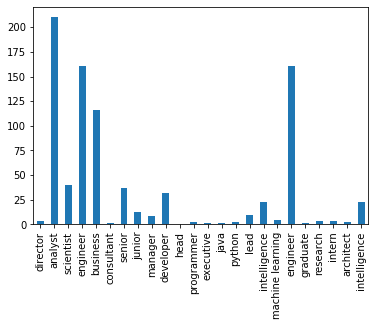

In [59]:
df_categories.sum().plot(kind = 'bar');

In [60]:
final_jobs = pd.concat([df[['salary_high_low']],X, df_categories], axis = 1 )

In [61]:
final_jobs.head()

,salary_high_low,AK,AL,AR,AZ,CA,CO,CT,DC,DE,...,python,lead,intelligence,machine learning,engineer,graduate,research,intern,architect,intelligence
0,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [62]:
final_jobs.columns

Index(['salary_high_low', ' AK', ' AL', ' AR', ' AZ', ' CA', ' CO', ' CT',
       ' DC', ' DE', ' FL', ' GA', ' IA', ' ID', ' IL', ' IN', ' KS', ' KY',
       ' LA', ' MA', ' MD', ' MI', ' MN', ' MO', ' MS', ' NC', ' NE', ' NJ',
       ' NM', ' NV', ' NY', ' OH', ' OR', ' PA', ' PR', ' RI', ' SC', ' TN',
       ' TX', ' UT', ' VA', ' WA', ' WI', ' WV', 'Maryland', 'Massachusetts',
       'Remote', 'United States', 'Washington State', 'director', 'analyst',
       'scientist', 'engineer', 'business', 'consultant', 'senior', 'junior',
       'manager', 'developer', 'head', 'programmer', 'executive', 'java',
       'python', 'lead', 'intelligence', 'machine learning', 'engineer',
       'graduate', 'research', 'intern', 'architect', 'intelligence'],
      dtype='object')

In [63]:
final_jobs.to_csv("indeed_final.csv", index = False)

In [64]:
final_jobs = pd.read_csv("indeed_final.csv")

In [65]:
y = final_jobs.salary_high_low

In [66]:
X = final_jobs.drop('salary_high_low', axis = 1)

In [67]:
from scipy import sparse

In [68]:
matrix = sparse.csr_matrix(X.values)

In [69]:
X_train, X_test, y_train, y_test = train_test_split(matrix, y, stratify=y, test_size=0.2, random_state=42)

## LogisticRegression

In [72]:
# setting grid search with logisticRegression model

lr = LogisticRegression()

lr_params = {'C': np.logspace(-4, 4, 10),
          'penalty': ['l1', 'l2'],
          'fit_intercept': [True, False],
          'solver': ['liblinear','lbfgs', 'saga']}

gs_lr = GridSearchCV(estimator=lr,
                     param_grid=lr_params,
                     cv=5,
                     verbose = 2,
                    n_jobs = 1)

In [73]:
gs_lr.fit(X_train,y_train)

Fitting 5 folds for each of 120 candidates, totalling 600 fits
[CV] C=0.0001, fit_intercept=True, penalty=l1, solver=liblinear ......
[CV]  C=0.0001, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=0.0001, fit_intercept=True, penalty=l1, solver=liblinear ......
[CV]  C=0.0001, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=0.0001, fit_intercept=True, penalty=l1, solver=liblinear ......
[CV]  C=0.0001, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=0.0001, fit_intercept=True, penalty=l1, solver=liblinear ......
[CV]  C=0.0001, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=0.0001, fit_intercept=True, penalty=l1, solver=liblinear ......
[CV]  C=0.0001, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=0.0001, fit_intercept=True, penalty=l1, solver=lbfgs ..........
[CV]  C=0.0001, fit_intercept=True, penalty=l1, solver=lbfgs, total=   0.0s
[CV] C=0.0001, fit_intercept=True, 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to

[CV]  C=0.000774263682681127, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=0.000774263682681127, fit_intercept=True, penalty=l2, solver=liblinear 
[CV]  C=0.000774263682681127, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=0.000774263682681127, fit_intercept=True, penalty=l2, solver=liblinear 
[CV]  C=0.000774263682681127, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=0.000774263682681127, fit_intercept=True, penalty=l2, solver=liblinear 
[CV]  C=0.000774263682681127, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=0.000774263682681127, fit_intercept=True, penalty=l2, solver=lbfgs 
[CV]  C=0.000774263682681127, fit_intercept=True, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=0.000774263682681127, fit_intercept=True, penalty=l2, solver=lbfgs 
[CV]  C=0.000774263682681127, fit_intercept=True, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=0.000774263682681127, fit_intercept=True, penalty=

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)


[CV]  C=0.005994842503189409, fit_intercept=True, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=0.005994842503189409, fit_intercept=True, penalty=l2, solver=saga 
[CV]  C=0.005994842503189409, fit_intercept=True, penalty=l2, solver=saga, total=   0.0s
[CV] C=0.005994842503189409, fit_intercept=True, penalty=l2, solver=saga 
[CV]  C=0.005994842503189409, fit_intercept=True, penalty=l2, solver=saga, total=   0.0s
[CV] C=0.005994842503189409, fit_intercept=True, penalty=l2, solver=saga 
[CV]  C=0.005994842503189409, fit_intercept=True, penalty=l2, solver=saga, total=   0.0s
[CV] C=0.005994842503189409, fit_intercept=True, penalty=l2, solver=saga 
[CV]  C=0.005994842503189409, fit_intercept=True, penalty=l2, solver=saga, total=   0.0s
[CV] C=0.005994842503189409, fit_intercept=True, penalty=l2, solver=saga 
[CV]  C=0.005994842503189409, fit_intercept=True, penalty=l2, solver=saga, total=   0.0s
[CV] C=0.005994842503189409, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=0.00599

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only

[CV]  C=0.046415888336127774, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=0.046415888336127774, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=0.046415888336127774, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=0.046415888336127774, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=0.046415888336127774, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=0.046415888336127774, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=0.046415888336127774, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=0.046415888336127774, fit_intercept=False, penalty=l1, solver=lbfgs 
[CV]  C=0.046415888336127774, fit_intercept=False, penalty=l1, solver=lbfgs, total=   0.0s
[CV] C=0.046415888336127774, fit_intercept=False, penalty=l1, solver=lbfgs 
[CV]  C=0.046415888336127774, fit_intercept=False, penalty=l1, solver=lbfgs, total=   0.0s
[CV] C=0.046415888336127774, fit_intercept=Fal

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did 


[CV] C=0.3593813663804626, fit_intercept=True, penalty=l2, solver=saga 
[CV]  C=0.3593813663804626, fit_intercept=True, penalty=l2, solver=saga, total=   0.0s
[CV] C=0.3593813663804626, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=0.3593813663804626, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=0.3593813663804626, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=0.3593813663804626, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=0.3593813663804626, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=0.3593813663804626, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=0.3593813663804626, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=0.3593813663804626, fit_intercept=False, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=0.3593813663804626, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=0.3593813663804626, fit_intercept=False, penalty=l1, solver=liblinear,

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages

[CV]  C=2.782559402207126, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=True, penalty=l2, solver=lbfgs 
[CV]  C=2.782559402207126, fit_intercept=True, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=True, penalty=l2, solver=lbfgs 
[CV]  C=2.782559402207126, fit_intercept=True, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=True, penalty=l2, solver=lbfgs 
[CV]  C=2.782559402207126, fit_intercept=True, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=True, penalty=l2, solver=lbfgs 
[CV]  C=2.782559402207126, fit_intercept=True, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=True, penalty=l2, solver=lbfgs 
[CV]  C=2.782559402207126, fit_intercept=True, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=True, penalty=l2, solver=saga 
[CV]  C=2.782559402207126, fit_intercept=Tr

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages

[CV]  C=2.782559402207126, fit_intercept=False, penalty=l1, solver=saga, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=False, penalty=l2, solver=liblinear 
[CV]  C=2.782559402207126, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=False, penalty=l2, solver=liblinear 
[CV]  C=2.782559402207126, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=False, penalty=l2, solver=liblinear 
[CV]  C=2.782559402207126, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=False, penalty=l2, solver=liblinear 
[CV]  C=2.782559402207126, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=False, penalty=l2, solver=liblinear 
[CV]  C=2.782559402207126, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=2.782559402207126, fit_intercept=False, penalty=l2, solver=lb

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages

[CV]  C=21.54434690031882, fit_intercept=True, penalty=l1, solver=saga, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=True, penalty=l1, solver=saga 
[CV]  C=21.54434690031882, fit_intercept=True, penalty=l1, solver=saga, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=True, penalty=l2, solver=liblinear 
[CV]  C=21.54434690031882, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=True, penalty=l2, solver=liblinear 
[CV]  C=21.54434690031882, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=True, penalty=l2, solver=liblinear 
[CV]  C=21.54434690031882, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=True, penalty=l2, solver=liblinear 
[CV]  C=21.54434690031882, fit_intercept=True, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=True, penalty=l2, solver=liblinear 
[CV]  C=21.54

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did 

[CV] C=21.54434690031882, fit_intercept=False, penalty=l1, solver=saga 
[CV]  C=21.54434690031882, fit_intercept=False, penalty=l1, solver=saga, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=False, penalty=l1, solver=saga 
[CV]  C=21.54434690031882, fit_intercept=False, penalty=l1, solver=saga, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=False, penalty=l1, solver=saga 
[CV]  C=21.54434690031882, fit_intercept=False, penalty=l1, solver=saga, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=False, penalty=l1, solver=saga 
[CV]  C=21.54434690031882, fit_intercept=False, penalty=l1, solver=saga, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=False, penalty=l2, solver=liblinear 
[CV]  C=21.54434690031882, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=21.54434690031882, fit_intercept=False, penalty=l2, solver=liblinear 
[CV]  C=21.54434690031882, fit_intercept=False, penalty=l2, solver=liblinear, total=   0.0s
[CV] C=21.54434690031882, 

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did 

[CV]  C=166.81005372000558, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=True, penalty=l1, solver=liblinear 
[CV]  C=166.81005372000558, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=True, penalty=l1, solver=liblinear 
[CV]  C=166.81005372000558, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=True, penalty=l1, solver=liblinear 
[CV]  C=166.81005372000558, fit_intercept=True, penalty=l1, solver=liblinear, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=True, penalty=l1, solver=lbfgs 
[CV]  C=166.81005372000558, fit_intercept=True, penalty=l1, solver=lbfgs, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=True, penalty=l1, solver=lbfgs 
[CV]  C=166.81005372000558, fit_intercept=True, penalty=l1, solver=lbfgs, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=True, penalty=l1, solver=lbfgs 
[CV]  

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-reg

[CV]  C=166.81005372000558, fit_intercept=True, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=True, penalty=l2, solver=lbfgs 
[CV]  C=166.81005372000558, fit_intercept=True, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=True, penalty=l2, solver=saga 
[CV]  C=166.81005372000558, fit_intercept=True, penalty=l2, solver=saga, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=True, penalty=l2, solver=saga 
[CV]  C=166.81005372000558, fit_intercept=True, penalty=l2, solver=saga, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=True, penalty=l2, solver=saga 
[CV]  C=166.81005372000558, fit_intercept=True, penalty=l2, solver=saga, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=True, penalty=l2, solver=saga 
[CV]  C=166.81005372000558, fit_intercept=True, penalty=l2, solver=saga, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=True, penalty=l2, solver=saga 
[CV]  C=166.81005372000558, fit_intercept=T

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown


[CV] C=166.81005372000558, fit_intercept=False, penalty=l2, solver=lbfgs 
[CV]  C=166.81005372000558, fit_intercept=False, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=False, penalty=l2, solver=lbfgs 
[CV]  C=166.81005372000558, fit_intercept=False, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=False, penalty=l2, solver=lbfgs 
[CV]  C=166.81005372000558, fit_intercept=False, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=False, penalty=l2, solver=saga 
[CV]  C=166.81005372000558, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=False, penalty=l2, solver=saga 
[CV]  C=166.81005372000558, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=166.81005372000558, fit_intercept=False, penalty=l2, solver=saga 
[CV]  C=166.81005372000558, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=166.81005372000558, 

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages

[CV]  C=1291.5496650148827, fit_intercept=True, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=True, penalty=l2, solver=saga 
[CV]  C=1291.5496650148827, fit_intercept=True, penalty=l2, solver=saga, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=True, penalty=l2, solver=saga 
[CV]  C=1291.5496650148827, fit_intercept=True, penalty=l2, solver=saga, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=True, penalty=l2, solver=saga 
[CV]  C=1291.5496650148827, fit_intercept=True, penalty=l2, solver=saga, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=True, penalty=l2, solver=saga 
[CV]  C=1291.5496650148827, fit_intercept=True, penalty=l2, solver=saga, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=True, penalty=l2, solver=saga 
[CV]  C=1291.5496650148827, fit_intercept=True, penalty=l2, solver=saga, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=False, penalty=l1, solver=liblinear 
[CV]  C=1291.5496650148827, fit_interce

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-reg

[CV]  C=1291.5496650148827, fit_intercept=False, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=False, penalty=l2, solver=lbfgs 
[CV]  C=1291.5496650148827, fit_intercept=False, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=False, penalty=l2, solver=lbfgs 
[CV]  C=1291.5496650148827, fit_intercept=False, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=False, penalty=l2, solver=lbfgs 
[CV]  C=1291.5496650148827, fit_intercept=False, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=False, penalty=l2, solver=saga 
[CV]  C=1291.5496650148827, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=False, penalty=l2, solver=saga 
[CV]  C=1291.5496650148827, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=1291.5496650148827, fit_intercept=False, penalty=l2, solver=saga 
[CV]  C=1291.5496650148827,

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-reg


[CV] C=10000.0, fit_intercept=False, penalty=l1, solver=lbfgs ........
[CV]  C=10000.0, fit_intercept=False, penalty=l1, solver=lbfgs, total=   0.0s
[CV] C=10000.0, fit_intercept=False, penalty=l1, solver=lbfgs ........
[CV]  C=10000.0, fit_intercept=False, penalty=l1, solver=lbfgs, total=   0.0s
[CV] C=10000.0, fit_intercept=False, penalty=l1, solver=lbfgs ........
[CV]  C=10000.0, fit_intercept=False, penalty=l1, solver=lbfgs, total=   0.0s
[CV] C=10000.0, fit_intercept=False, penalty=l1, solver=lbfgs ........
[CV]  C=10000.0, fit_intercept=False, penalty=l1, solver=lbfgs, total=   0.0s
[CV] C=10000.0, fit_intercept=False, penalty=l1, solver=lbfgs ........
[CV]  C=10000.0, fit_intercept=False, penalty=l1, solver=lbfgs, total=   0.0s
[CV] C=10000.0, fit_intercept=False, penalty=l1, solver=saga .........
[CV]  C=10000.0, fit_intercept=False, penalty=l1, solver=saga, total=   0.0s
[CV] C=10000.0, fit_intercept=False, penalty=l1, solver=saga .........
[CV]  C=10000.0, fit_intercept=Fals

C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentatio

[CV]  C=10000.0, fit_intercept=False, penalty=l2, solver=lbfgs, total=   0.0s
[CV] C=10000.0, fit_intercept=False, penalty=l2, solver=saga .........
[CV]  C=10000.0, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=10000.0, fit_intercept=False, penalty=l2, solver=saga .........
[CV]  C=10000.0, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=10000.0, fit_intercept=False, penalty=l2, solver=saga .........
[CV]  C=10000.0, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=10000.0, fit_intercept=False, penalty=l2, solver=saga .........
[CV]  C=10000.0, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s
[CV] C=10000.0, fit_intercept=False, penalty=l2, solver=saga .........
[CV]  C=10000.0, fit_intercept=False, penalty=l2, solver=saga, total=   0.0s


C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\ANKIT\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did 

GridSearchCV(cv=5, error_score=nan,
             estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                          fit_intercept=True,
                                          intercept_scaling=1, l1_ratio=None,
                                          max_iter=100, multi_class='auto',
                                          n_jobs=None, penalty='l2',
                                          random_state=None, solver='lbfgs',
                                          tol=0.0001, verbose=0,
                                          warm_start=False),
             iid='deprecated', n_jobs=1,
             param_grid={'C': array([1.00000000e-04, 7.74263683e-04, 5.99484250e-03, 4.64158883e-02,
       3.59381366e-01, 2.78255940e+00, 2.15443469e+01, 1.66810054e+02,
       1.29154967e+03, 1.00000000e+04]),
                         'fit_intercept': [True, False],
                         'penalty': ['l1', 'l2'],
                         'solver': 

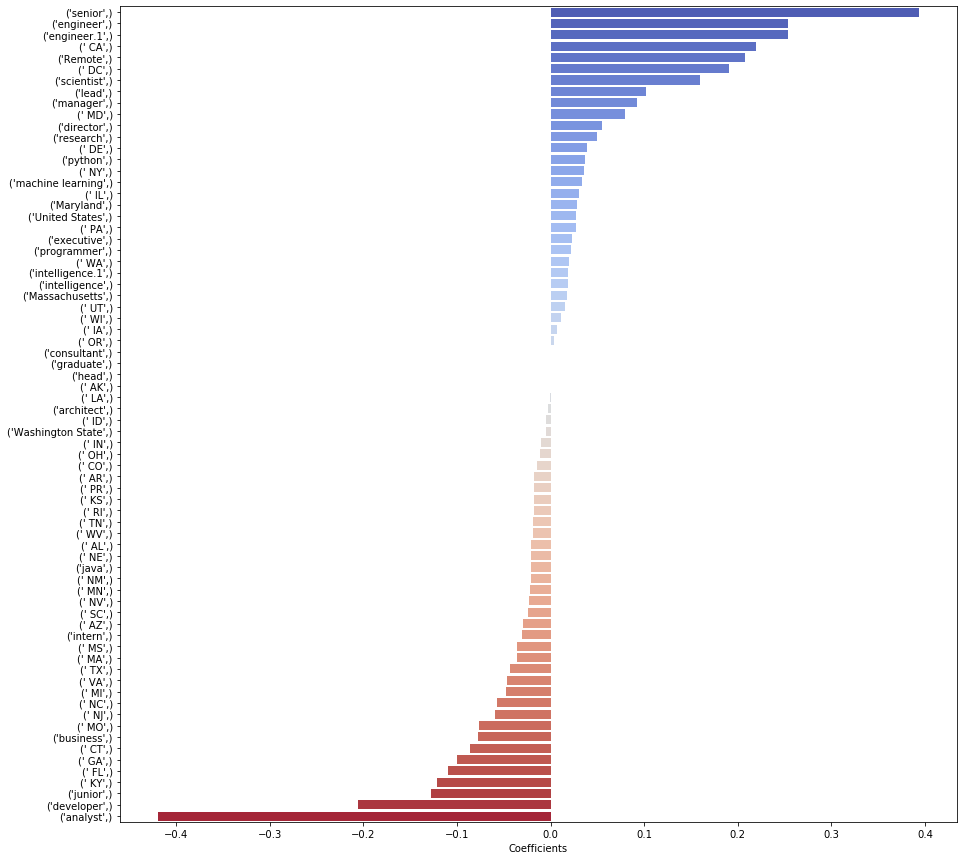

In [74]:
coeff_df = pd.DataFrame(gs_lr.best_estimator_.coef_, columns = [X.columns], index = ['Coefficients']).T.sort_values('Coefficients', ascending = False)

fig,ax= plt.subplots(figsize=(15,15))
sns.barplot(y=coeff_df.index, x=coeff_df.Coefficients, orient='h', palette='coolwarm',ax=ax);

In [75]:
predictions = gs_lr.best_estimator_.predict(X_test)

In [76]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, fbeta_score, classification_report

In [77]:
pd.DataFrame(confusion_matrix(y_test, predictions), index = ['actual LOW', 'actual HIGH'], 
             columns = ['predicted LOW', 'predicted HIGH'])

,predicted LOW,predicted HIGH
actual LOW,34,13
actual HIGH,14,34


In [78]:
pd.DataFrame([accuracy_score(y_test, predictions), precision_score(y_test, predictions),
              recall_score(y_test, predictions), f1_score(y_test, predictions)], columns = ['scores'], 
             index = ['accuracy','precision', 'recall', 'f1'])

,scores
accuracy,0.715789
precision,0.723404
recall,0.708333
f1,0.715789


In [79]:
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       0.71      0.72      0.72        47
           1       0.72      0.71      0.72        48

    accuracy                           0.72        95
   macro avg       0.72      0.72      0.72        95
weighted avg       0.72      0.72      0.72        95



In [80]:
predictions_df = pd.DataFrame()
predictions_df['actual']= y_test
predictions_df['predicted']= predictions
predictions_df['probability_HIGH']= gs_lr.best_estimator_.predict_proba(X_test)[:,1]
predictions_df.head()

,actual,predicted,probability_HIGH
69,1,0,0.403942
226,0,1,0.612728
285,1,1,0.671324
102,1,0,0.405143
213,1,1,0.613752


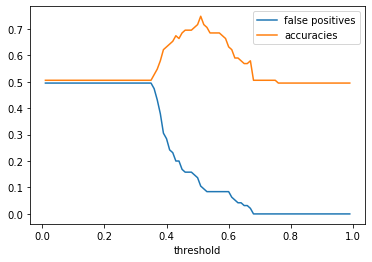

In [81]:
false_positives = []
for thresh in np.arange(1, 100)/100:
    labeled_1 = np.array([1 if x >= thresh else 0 for x in predictions_df.probability_HIGH.values])
    fp = np.mean((y_test == 0) & (labeled_1 == 1))
    false_positives.append(fp)
   

accuracy = []
for thresh in np.arange(1, 100)/100:
    labeled_1 = np.array([1 if x >= thresh else 0 for x in predictions_df.probability_HIGH.values])
    acc = np.mean(labeled_1 == y_test)
    accuracy.append(acc)
    
false_positives = np.array(false_positives)
accuracy = np.array(accuracy)
plt.plot(np.arange(1, 100)/100, false_positives, label='false positives')
plt.plot(np.arange(1, 100)/100, accuracy, label='accuracies')
plt.legend()
plt.xlabel('threshold')
plt.show()

In [82]:
predictions_df['60_precent_threshold']= predictions_df.probability_HIGH.map(lambda x:1 if x>= 0.6 else 0)
predictions_df.head()

,actual,predicted,probability_HIGH,60_precent_threshold
69,1,0,0.403942,0
226,0,1,0.612728,1
285,1,1,0.671324,1
102,1,0,0.405143,0
213,1,1,0.613752,1


In [83]:
pd.DataFrame([accuracy_score(y_test, predictions_df['60_precent_threshold']), 
              precision_score(y_test, predictions_df['60_precent_threshold']),
              recall_score(y_test, predictions_df['60_precent_threshold']),
              f1_score(y_test, predictions_df['60_precent_threshold'])], columns = ['scores 60_percent_threshold'], 
             index = ['accuracy','precision', 'recall', 'f1'])

,scores 60_percent_threshold
accuracy,0.631579
precision,0.724138
recall,0.437500
f1,0.545455


In [84]:
pd.DataFrame(confusion_matrix(y_test, predictions_df['60_precent_threshold']), index = ['actual LOW', 'actual HIGH'], 
             columns = ['predicted LOW', 'predicted HIGH'])

,predicted LOW,predicted HIGH
actual LOW,39,8
actual HIGH,27,21


In [85]:
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score

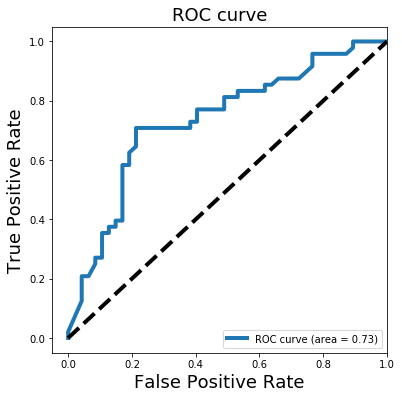

In [86]:
#Finding area under the curve
fpr, tpr, threshold = roc_curve(y_test, predictions_df.probability_HIGH)
roc_auc = auc(fpr, tpr)

#Plotting ROC curve for High Salary
plt.figure(figsize=[6, 6])
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc, linewidth=4)
plt.plot([0, 1], [0, 1], 'k--', linewidth=4)
plt.xlim([-0.05, 1.0])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate', fontsize=18)
plt.ylabel('True Positive Rate', fontsize=18)
plt.title('ROC curve', fontsize=18)
plt.legend(loc="lower right")
plt.show()

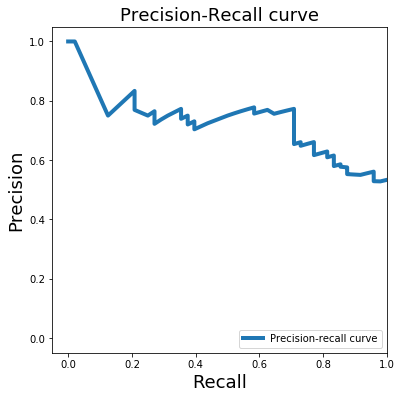

In [87]:
#Finding area under the curve
precision, recall, threshold = precision_recall_curve(y_test, predictions_df.probability_HIGH)


# Plotting precision-recall curve for High Salary 
plt.figure(figsize=[6, 6])
plt.plot(recall, precision, label='Precision-recall curve', linewidth=4)
plt.xlim([-0.05, 1.0])
plt.ylim([-0.05, 1.05])
plt.xlabel('Recall', fontsize=18)
plt.ylabel('Precision', fontsize=18)
plt.title('Precision-Recall curve', fontsize=18)
plt.legend(loc="lower right")
plt.show()

## DecisionTree

In [88]:
from sklearn.tree import DecisionTreeClassifier

In [89]:
# Setting up grid search with DecisionTree model

dtc = DecisionTreeClassifier()

dtc_params = {
    'max_depth': list(range(1, 10))+[None],
    'criterion': ['gini', 'entropy'],
    'max_features': list(range(1, 10))+[None],
    'min_samples_split': [2, 3, 4, 5, 10, 15, 20, 25, 30, 40, 50],
    'ccp_alpha': [0, 0.001, 0.005, 0.01]
}


gs_dtc = GridSearchCV(dtc, dtc_params, cv=5, verbose=2, n_jobs=1)

In [90]:
gs_dtc.fit(X_train, y_train)

Fitting 5 folds for each of 8800 candidates, totalling 44000 fits
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, c

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s



[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=2, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=3, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=5, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=7, min_samples_sp

[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=8, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=1, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=1, max_features=None, min_sa

[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=1, min_samples_split=5, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=2, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=4, min_samples_split=5, 

[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=5, min_samples_

[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=7, min_samples_split=5 
[

[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=8, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=2, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=2, max_fea

[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=1, min_samples

[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=3, min_samples_split=4 
[

[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=4, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=6, min_samples_split=3, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=7, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=9, min_samples_split=

[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=3, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=3, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=

[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=1, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=3, min_samples_spli

[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=4, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=6, min_samples_spli

[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=7, min_samples

[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=9, min_samples_split=5 
[

[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=4, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=4, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=

[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=2, min_samples_split=3, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=3, min_samples

[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=5, min_samples_

[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=6, min_samples_split=5, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=7, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=9, min_samples_split=10

[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=5, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=5, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=

[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=2, min_samples_split=4 
[

[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=3, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=5, min_samples_split=4, 

[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=6, min_samples_

[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=8, min_samples_split=3 
[

[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=6, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=6, max_features=9, min_samples

[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=1, min_samples_split=3 
[

[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=2, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=4, min_samples_split=4, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=5, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=7, min_samples_split=5, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=8, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=7, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=7, max_fea

[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=1, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=3, min_samples_split=5, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=4, min_samples

[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=6, min_samples_split=10 


[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=7, min_samples

[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=9, min_samples_split=5 
[

[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=8, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=8, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=

[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=2, min_samples_split=4, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=3, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=5, min_samples_split=5, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=6, min_samples

[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=8, min_samples_split=5, 

[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=9, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=9, max_features=9, min_samples

[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_f

[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=

[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, m

[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=gini, max_depth=

[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=

[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_f

[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=gini, max_depth=

[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=gini, max_depth=None, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=gini, max_depth=None, max_features=None, min_samples_split=50 
[CV]  ccp_alpha

[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_

[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_dept

[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=1, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=1, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0, cri

[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=2, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=2, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max

[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_dept

[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=5, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, m

[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=3, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=3, max_features=None, min_samples_split=25 
[CV]  ccp_alpha

[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=4, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=4, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5,

[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=5, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=5, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5,

[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=5, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=5, max_features=None, min_samples_split=20 
[CV]  ccp_alpha

[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_

[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_dept

[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_f

[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=6, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=6, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=7, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=7, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0, criter

[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_

[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=8, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=8, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=

[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max

[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_

[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=9, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=9, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0, criterion=entropy, max_dep

[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0, criter

[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=

[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0, cri

[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0, c

[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=6, min_samples_split=30 
[CV]  ccp_alpha

[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0, criteri

[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=9, min_samples_split=20 
[CV]  ccp_alpha

[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0, criterion=entropy, max_depth=None, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0, criterion=entropy, max_depth=None, max_features=None, min_sam

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=1, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gi

[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_dep

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_d

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=2, max_features=None, min_samples_split=5 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=3, max_features=None, min_samples_split=30 
[CV] 

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=4, max_features=None, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=5, max_features=None, min_samples_split=40 
[CV] 

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=6, max_features=None, min_samples_split=15 
[CV] 

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gi

[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_dep

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=7, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=1, min_samples_split=2 
[CV]  ccp

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_d

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=8, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.001, cr

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, m

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=gi

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_de

[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gin

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gin

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, m

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=9, max_features=None, min_samples_split=30 
[CV] 

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=1, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=3, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=4, min_samples_split=4 
[CV]  ccp_alpha

[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=6, min_samples_split=15 
[CV] 

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=7, min_samples_split=15 
[CV] 

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=8, min_samples_split=25 
[CV] 

[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=9, min_samples_split=30 
[CV] 

[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=gini, max_depth=None, max_features=None, min_samples

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=2, min_samples_split=2 
[CV]  cc

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=3, min_samples_split=10 
[CV]  

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=4, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=6, min_samples_split=10 
[CV]  cc

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=7, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=9, min_samples_split=15 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=1, max_features=Non

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=2, min_samples_split=10 
[CV]  

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=3, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=5, min_samples_split=15 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=6, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=8, min_samples_split=15 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=2, max_features=9, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=1, min_samples_split=15 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=2, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=4, min_samples_split=10 
[CV]  

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=5, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=5, min_samples_split=50 
[CV] 

[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=7, min_samples_split=10, total=   0.0s
[CV] cc

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=8, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=3, max_features=None, min_

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=1, min_samples_split=40 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=3, min_samples_split=5 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=4, min_samples_split=40 
[CV] 

[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=7, min_samples_split=30 
[CV] 

[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=4, max_features=Non

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=2, min_samples_split=4 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=3, min_samples_split=25 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=5, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=6, min_samples_split=25 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=8, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=9, min_samples_split=20 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=5, max_features=Non

[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=2, min_samples_split=15, total=   0.0s
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=3, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=5, min_samples_split=10 
[CV]  cc

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=6, min_samples_split=40 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=8, min_samples_split=10 
[CV]  ccp_alph

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=6, max_features=9, min_samples_split=30 
[CV] 

[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=2, min_samples_split=25 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=4, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=5, min_samples_split=4 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=6, min_samples_split=25 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=8, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=9, min_samples_split=20 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=7, max_features=Non

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=2, min_samples_split=10 
[CV]  ccp_alph

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=3, min_samples_split=40 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=5, min_samples_split=5 
[CV]  ccp_alpha

[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=6, min_samples_split=30, total=   0.0s
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=8, min_samples_split=3 
[CV]  ccp_alpha

[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=9, min_samples_split=20, total=   0.0s
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=8, max_features=Non

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=2, min_samples_split=10 
[CV]  ccp_

[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=3, min_samples_split=40, total=   0.0s
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=5, min_samples_split=5 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=6, min_samples_split=30 
[CV] 

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=8, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=9, min_samples_split=20 
[CV] 

[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=9, max_features=None, min_samples

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=2, min_sa

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=6, min_sa

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=

[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.001, criterion=entropy, max_depth=None, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.001, criterion=entropy, max_depth=N

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, m

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=5, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=5, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gi

[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, m

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=1, max_features=None, min_samples_split=10 
[CV]  

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gi

[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_dep

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=2, max_features=None, min_samples_split=30 
[CV] 

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=3, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gi

[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_dep

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=4, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, ma

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=5, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, m

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=6, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gin

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=7, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_d

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gi

[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=8, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=1, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=1, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=1, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=1, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=1, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, m

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=gini, max_de

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gi

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=9, max_features=None, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=1, min_samples_split=10 
[CV]  

[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=2, min_samples_split=30, total=   0.0s
[CV] 

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=4, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=5, min_samples_split=15 
[CV] 

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=6, min_samples_split=40 
[CV] 

[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=9, min_samples_split=15 
[CV] 

[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=gini, max_depth=None, max_features=Non

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=2, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=3, min_samples_split=25 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=5, min_samples_split=3 
[CV]  ccp_alpha

[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=6, min_samples_split=25, total=   0.0s
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=8, min_samples_split=4 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=1, max_features=9, min_samples_split=25 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=1, min_samples_split=4 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=2, min_samples_split=25 
[CV] 

[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=5, min_samples_split=30 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=7, min_samples_split=4 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=8, min_samples_split=25 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=2, max_features=None, min_sa

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=1, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=1, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=1, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=1, min_samples_split=25 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=3, min_samples_split=4 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=4, min_samples_split=25 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=6, min_samples_split=4 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=7, min_samples_split=25 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=9, min_samples_split=3 
[CV]  ccp_alpha

[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=3, max_features=None, min_samples

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=2, min_samples_split=3 
[CV]  ccp_alpha

[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=3, min_samples_split=20, total=   0.0s
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=5, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=6, min_samples_split=20 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=8, min_samples_split=2 
[CV]  ccp_alph

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=9, min_samples_split=20 
[CV] 

[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=4, max_features=None, min_samples

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=2, min_samples_split=15 
[CV] 

[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=3, min_samples_split=50, total=   0.0s
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=5, min_samples_split=10 
[CV]  ccp_al

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=6, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=6, min_samples_split=40 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=8, min_samples_split=5 
[CV]  ccp_alpha

[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=5, max_features=9, min_samples_split=30, total=   0.0s
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=1, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=2, min_samples_split=25 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=4, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=5, min_samples_split=20 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=7, min_samples_split=2 
[CV]  ccp_alph

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=8, min_samples_split=10 
[CV]  cc

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=6, max_features=9, min_samples_split=40 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=1, min_samples_split=4 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=2, min_samples_split=25 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=4, min_samples_split=2 
[CV]  ccp_al

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=5, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=5, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=5, min_samples_split=15 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=6, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=6, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=8, min_samples_split=10 
[CV]  cc

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=9, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=7, max_features=9, min_samples_split=40 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=1, min_samples_split=4 
[CV]  ccp_alpha

[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=2, min_samples_split=25, total=   0.0s
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=4, min_samples_split=4 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=5, min_samples_split=25 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=7, min_samples_split=2 
[CV]  ccp_alph

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=8, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=8, min_samples_split=15 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=8, max_features=9, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=1, min_samples_split=5 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=2, min_samples_split=30 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=4, min_samples_split=4 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=5, min_samples_split=25 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=7, min_samples_split=3 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=8, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=8, min_samples_split=15 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=9, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=9, max_features=9, min_samples_split=50 
[CV] 

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=1, min_sa

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=5, min_sa

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=9, min_sa

[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.005, criterion=entropy, max_depth=None, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.005, criterion=entropy, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=1, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_

[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=1, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=2, max_features=9, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_

[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_dept

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=3, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=1, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=1, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=1, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=1, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=1, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=1, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=1, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=1, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=1, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=1, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=2, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=2, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, m

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=5, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=5, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=5, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=

[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_dept

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=4, max_features=None, min_samples_split=15 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=3, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5,

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=4, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=4, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=5, max_features=None, min_samples_split=25 
[CV]  ccp_alpha

[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_f

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=3, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=5, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=5, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=6, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=6, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=6, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=7, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=7, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=8, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=8, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6,

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=9, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=9, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=None, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=None, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=6, max_features=None, min_samples_split=40 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=2, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=2, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=None, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=7, max_features=None, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=1, min_samples_split=2 
[CV]  ccp_alpha=0.01, crite

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=2, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=2, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=2, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=2, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=3, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=3, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=3, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=3, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=5, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=5, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=5, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, m

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, m

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=8, max_features=None, min_samples_split=25 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=2, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=3, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=3, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=3, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=4, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=4, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=5, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=5, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=6, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=6, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=6, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=7, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=7, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=gini, max_dep

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=None, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=None, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=9, max_features=None, min_samples_split=25 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=1, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=1, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=2, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=2, min_samples_split=2 
[CV]  ccp_alpha=0.01

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.01, cr

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=4, min_samples_split=25 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=5, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.01, 

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=8, min_samples_split=25 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=9, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=gini, max_depth=None, max_features=9, min_samples_split=50 
[CV]  ccp_alpha

[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=1, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=1, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, crit

[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=2, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=4, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=4, min_samples_split=4 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=5, min_samples_split=30 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=7, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=8, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=8, min_samples_split=30 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=1, max_features=None, min_samples_spli

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=1, min_samples_split=30 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=4, min_samples_split=40 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=6, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=6, min_samples_split=5 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=7, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=7, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=7, min_samples_split=30 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=9, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=9, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=9, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=9, min_samples_split=5 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=2, max_features=None, min_sam

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=2, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=2, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=2, min_samples_split=4 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=3, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=3, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=3, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=3, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=3, min_samples_split=30 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=5, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=5, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=5, min_samples_split=5 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=6, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=6, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=6, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=6, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=6, min_samples_split=30 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=8, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=8, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=9, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=9, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=3, max_features=9, min_samples_split=25 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=1, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=1, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=1, min_samples_split=3 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=2, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=2, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=2, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=2, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=2, min_samples_split=25 
[CV]  ccp_alpha

[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=4, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=4, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=4, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=4, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, crit

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=5, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=5, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=5, min_samples_split=25 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=7, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=7, min_samples_split=3 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=8, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=8, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=8, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=8, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=8, min_samples_split=20 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=9, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=9, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=None, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=None, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=4, max_features=None, min_samples_split=2 
[CV] 

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=1, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=1, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=1, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=1, min_samples_split=10 
[CV]  ccp_alpha=0.01

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=2, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=2, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=2, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=2, min_samples_split=40 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.01, 

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=5, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=5, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=5, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=5, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=5, min_samples_split=40 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=7, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=7, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=7, min_samples_split=5 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=8, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=8, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=8, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=8, min_samples_split=30 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=None, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=None, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=None, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=5, max_features=None, min_samples_spli

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=1, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=1, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=1, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=1, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=1, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=1, min_samples_split=25 
[CV]  ccp_alpha

[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=3, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, crit

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=4, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=4, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=4, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=4, min_samples_split=20 
[CV]  ccp_alpha

[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=5, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=5, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=5, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=5, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01

[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=7, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=7, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=

[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=8, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=8, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=None, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=None, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=6, max_features=None, min_samples_spli

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=1, min_samples_split=30 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=3, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=4, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=4, min_samples_split=25 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=6, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=6, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=7, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=7, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=7, min_samples_split=20 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=8, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=None, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=7, max_features=None, min_samp

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=1, min_samples_split=40 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=3, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=3, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=4, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=4, min_samples_split=30 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=7, min_samples_split=25 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=9, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=9, min_samples_split=3 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=None, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=None, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=8, max_features=None, min_sam

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=1, min_samples_split=40 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=1, min_samples_split=40, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=1, min_samples_split=40 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=3, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=3, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=3, min_samples_split=10 
[CV]  ccp_alpha=0.01, cr

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=4, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=4, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=4, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=4, min_samples_split=30 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=6, min_samples_split=3 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=6, min_samples_split=3, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=6, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=6, min_samples_split=4 
[CV]  ccp_alpha=0.01, cri

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=7, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=7, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=7, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=7, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=7, min_samples_split=25 
[CV]  ccp_alpha

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=8, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=9, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=9, min_samples_split=2 
[CV]  ccp_alpha=0.01, cr

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=None, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=None, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=9, max_features=None, min_sam

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=1, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=1, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=1, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=1, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=1, min_sam

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=3, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=3, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=3, min_samples_spli

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=4, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=4, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=4, min_samples_split=10 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=4, min_samples_split=10, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=4, min_samples_

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=5, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=5, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=5, min_sam

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=6, min_samples_split=50 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=6, min_samples_split=50, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=7, min_samples_split=2 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=7, min_samples_split=2, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=7, min_sampl

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=8, min_samples_split=4 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=8, min_samples_split=4, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=8, min_samples_split=5 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=8, min_samples_split=5, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=8, min_samples_spli

[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=9, min_samples_split=15 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=9, min_samples_split=15, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=9, min_samples_split=20, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=9, min_samples_split=20 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=9, min_samples_split=20,

[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=None, min_samples_split=25 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=None, min_samples_split=25, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=None, min_samples_split=30 
[CV]  ccp_alpha=0.01, criterion=entropy, max_depth=None, max_features=None, min_samples_split=30, total=   0.0s
[CV] ccp_alpha=0.01, criterion=entropy, max_depth=No

[Parallel(n_jobs=1)]: Done 44000 out of 44000 | elapsed:  1.7min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=1,
             param_grid={'ccp_alpha': [0, 0.001, 0.005, 0.01],
                  

In [91]:
#Extracting grid search results

print('Best Parameters:')
print(gs_dtc.best_params_)
print('Best estimator mean cross validated training score:')
print(gs_dtc.best_score_)
print('Best estimator score on the full training set:')
print(gs_dtc.score(X_train, y_train))
print('Best estimator score on the test set:')
print(gs_dtc.score(X_test, y_test))

Best Parameters:
{'ccp_alpha': 0.001, 'criterion': 'entropy', 'max_depth': 8, 'max_features': 6, 'min_samples_split': 10}
Best estimator mean cross validated training score:
0.6894736842105262
Best estimator score on the full training set:
0.6815789473684211
Best estimator score on the test set:
0.6736842105263158


## RandomForest

In [92]:
from sklearn.ensemble import RandomForestClassifier

In [93]:
#Setting grid search with RandomForest model

rfc = RandomForestClassifier()

rfc_params = {'max_depth':range(1,20),
          'max_features':["auto","log2",0.5, 0.8],
         'criterion':['gini','entropy'],
         'bootstrap':[True,False]}

gs_rfc = GridSearchCV(estimator=rfc,
                     param_grid=rfc_params,
                     cv=5,
                     verbose = 2,
                    n_jobs = 1)

In [94]:
gs_rfc.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 5 folds for each of 304 candidates, totalling 1520 fits
[CV] bootstrap=True, criterion=gini, max_depth=1, max_features=auto ..


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


[CV]  bootstrap=True, criterion=gini, max_depth=1, max_features=auto, total=   0.2s
[CV] bootstrap=True, criterion=gini, max_depth=1, max_features=auto ..
[CV]  bootstrap=True, criterion=gini, max_depth=1, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=1, max_features=auto ..
[CV]  bootstrap=True, criterion=gini, max_depth=1, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=1, max_features=auto ..
[CV]  bootstrap=True, criterion=gini, max_depth=1, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=1, max_features=auto ..
[CV]  bootstrap=True, criterion=gini, max_depth=1, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=1, max_features=log2 ..
[CV]  bootstrap=True, criterion=gini, max_depth=1, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=1, max_features=log2 ..
[CV]  bootstrap=True, criterion=gini, max_depth=1, max_features=log2, 

[CV]  bootstrap=True, criterion=gini, max_depth=3, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=3, max_features=0.8 ...
[CV]  bootstrap=True, criterion=gini, max_depth=3, max_features=0.8, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=3, max_features=0.8 ...
[CV]  bootstrap=True, criterion=gini, max_depth=3, max_features=0.8, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=3, max_features=0.8 ...
[CV]  bootstrap=True, criterion=gini, max_depth=3, max_features=0.8, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=3, max_features=0.8 ...
[CV]  bootstrap=True, criterion=gini, max_depth=3, max_features=0.8, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=3, max_features=0.8 ...
[CV]  bootstrap=True, criterion=gini, max_depth=3, max_features=0.8, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=4, max_features=auto ..
[CV]  bootstrap=True, criterion=gini, max_depth=4, max_features=auto, total=

[CV]  bootstrap=True, criterion=gini, max_depth=6, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=6, max_features=log2 ..
[CV]  bootstrap=True, criterion=gini, max_depth=6, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=6, max_features=0.5 ...
[CV]  bootstrap=True, criterion=gini, max_depth=6, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=6, max_features=0.5 ...
[CV]  bootstrap=True, criterion=gini, max_depth=6, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=6, max_features=0.5 ...
[CV]  bootstrap=True, criterion=gini, max_depth=6, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=6, max_features=0.5 ...
[CV]  bootstrap=True, criterion=gini, max_depth=6, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=6, max_features=0.5 ...
[CV]  bootstrap=True, criterion=gini, max_depth=6, max_features=0.5, total

[CV]  bootstrap=True, criterion=gini, max_depth=9, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=9, max_features=auto ..
[CV]  bootstrap=True, criterion=gini, max_depth=9, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=9, max_features=auto ..
[CV]  bootstrap=True, criterion=gini, max_depth=9, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=9, max_features=log2 ..
[CV]  bootstrap=True, criterion=gini, max_depth=9, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=9, max_features=log2 ..
[CV]  bootstrap=True, criterion=gini, max_depth=9, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=9, max_features=log2 ..
[CV]  bootstrap=True, criterion=gini, max_depth=9, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=9, max_features=log2 ..
[CV]  bootstrap=True, criterion=gini, max_depth=9, max_features=log2, 

[CV]  bootstrap=True, criterion=gini, max_depth=11, max_features=0.8, total=   0.2s
[CV] bootstrap=True, criterion=gini, max_depth=11, max_features=0.8 ..
[CV]  bootstrap=True, criterion=gini, max_depth=11, max_features=0.8, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=11, max_features=0.8 ..
[CV]  bootstrap=True, criterion=gini, max_depth=11, max_features=0.8, total=   0.2s
[CV] bootstrap=True, criterion=gini, max_depth=11, max_features=0.8 ..
[CV]  bootstrap=True, criterion=gini, max_depth=11, max_features=0.8, total=   0.2s
[CV] bootstrap=True, criterion=gini, max_depth=11, max_features=0.8 ..
[CV]  bootstrap=True, criterion=gini, max_depth=11, max_features=0.8, total=   0.2s
[CV] bootstrap=True, criterion=gini, max_depth=12, max_features=auto .
[CV]  bootstrap=True, criterion=gini, max_depth=12, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=12, max_features=auto .
[CV]  bootstrap=True, criterion=gini, max_depth=12, max_features=auto

[CV]  bootstrap=True, criterion=gini, max_depth=14, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=14, max_features=0.5 ..
[CV]  bootstrap=True, criterion=gini, max_depth=14, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=14, max_features=0.5 ..
[CV]  bootstrap=True, criterion=gini, max_depth=14, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=14, max_features=0.5 ..
[CV]  bootstrap=True, criterion=gini, max_depth=14, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=14, max_features=0.5 ..
[CV]  bootstrap=True, criterion=gini, max_depth=14, max_features=0.5, total=   0.2s
[CV] bootstrap=True, criterion=gini, max_depth=14, max_features=0.5 ..
[CV]  bootstrap=True, criterion=gini, max_depth=14, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=14, max_features=0.8 ..
[CV]  bootstrap=True, criterion=gini, max_depth=14, max_features=0.8,

[CV]  bootstrap=True, criterion=gini, max_depth=17, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=17, max_features=auto .
[CV]  bootstrap=True, criterion=gini, max_depth=17, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=17, max_features=log2 .
[CV]  bootstrap=True, criterion=gini, max_depth=17, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=17, max_features=log2 .
[CV]  bootstrap=True, criterion=gini, max_depth=17, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=17, max_features=log2 .
[CV]  bootstrap=True, criterion=gini, max_depth=17, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=17, max_features=log2 .
[CV]  bootstrap=True, criterion=gini, max_depth=17, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=gini, max_depth=17, max_features=log2 .
[CV]  bootstrap=True, criterion=gini, max_depth=17, max_features

[CV] bootstrap=True, criterion=gini, max_depth=19, max_features=0.8 ..
[CV]  bootstrap=True, criterion=gini, max_depth=19, max_features=0.8, total=   0.2s
[CV] bootstrap=True, criterion=gini, max_depth=19, max_features=0.8 ..
[CV]  bootstrap=True, criterion=gini, max_depth=19, max_features=0.8, total=   0.2s
[CV] bootstrap=True, criterion=gini, max_depth=19, max_features=0.8 ..
[CV]  bootstrap=True, criterion=gini, max_depth=19, max_features=0.8, total=   0.2s
[CV] bootstrap=True, criterion=entropy, max_depth=1, max_features=auto 
[CV]  bootstrap=True, criterion=entropy, max_depth=1, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=1, max_features=auto 
[CV]  bootstrap=True, criterion=entropy, max_depth=1, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=1, max_features=auto 
[CV]  bootstrap=True, criterion=entropy, max_depth=1, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=1, max_f

[CV]  bootstrap=True, criterion=entropy, max_depth=3, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=3, max_features=0.5 
[CV]  bootstrap=True, criterion=entropy, max_depth=3, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=3, max_features=0.5 
[CV]  bootstrap=True, criterion=entropy, max_depth=3, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=3, max_features=0.5 
[CV]  bootstrap=True, criterion=entropy, max_depth=3, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=3, max_features=0.5 
[CV]  bootstrap=True, criterion=entropy, max_depth=3, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=3, max_features=0.8 
[CV]  bootstrap=True, criterion=entropy, max_depth=3, max_features=0.8, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=3, max_features=0.8 
[CV]  bootstrap=True, criterion=entropy, max_depth=3, max_

[CV]  bootstrap=True, criterion=entropy, max_depth=6, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=6, max_features=auto 
[CV]  bootstrap=True, criterion=entropy, max_depth=6, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=6, max_features=auto 
[CV]  bootstrap=True, criterion=entropy, max_depth=6, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=6, max_features=log2 
[CV]  bootstrap=True, criterion=entropy, max_depth=6, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=6, max_features=log2 
[CV]  bootstrap=True, criterion=entropy, max_depth=6, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=6, max_features=log2 
[CV]  bootstrap=True, criterion=entropy, max_depth=6, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=6, max_features=log2 
[CV]  bootstrap=True, criterion=entropy, max_d

[CV]  bootstrap=True, criterion=entropy, max_depth=8, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=8, max_features=0.8 
[CV]  bootstrap=True, criterion=entropy, max_depth=8, max_features=0.8, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=8, max_features=0.8 
[CV]  bootstrap=True, criterion=entropy, max_depth=8, max_features=0.8, total=   0.2s
[CV] bootstrap=True, criterion=entropy, max_depth=8, max_features=0.8 
[CV]  bootstrap=True, criterion=entropy, max_depth=8, max_features=0.8, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=8, max_features=0.8 
[CV]  bootstrap=True, criterion=entropy, max_depth=8, max_features=0.8, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=8, max_features=0.8 
[CV]  bootstrap=True, criterion=entropy, max_depth=8, max_features=0.8, total=   0.2s
[CV] bootstrap=True, criterion=entropy, max_depth=9, max_features=auto 
[CV]  bootstrap=True, criterion=entropy, max_depth=9, max

[CV]  bootstrap=True, criterion=entropy, max_depth=11, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=11, max_features=log2 
[CV]  bootstrap=True, criterion=entropy, max_depth=11, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=11, max_features=log2 
[CV]  bootstrap=True, criterion=entropy, max_depth=11, max_features=log2, total=   0.2s
[CV] bootstrap=True, criterion=entropy, max_depth=11, max_features=log2 
[CV]  bootstrap=True, criterion=entropy, max_depth=11, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=11, max_features=0.5 
[CV]  bootstrap=True, criterion=entropy, max_depth=11, max_features=0.5, total=   0.2s
[CV] bootstrap=True, criterion=entropy, max_depth=11, max_features=0.5 
[CV]  bootstrap=True, criterion=entropy, max_depth=11, max_features=0.5, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=11, max_features=0.5 
[CV]  bootstrap=True, criterion=entropy

[CV]  bootstrap=True, criterion=entropy, max_depth=13, max_features=0.8, total=   0.2s
[CV] bootstrap=True, criterion=entropy, max_depth=13, max_features=0.8 
[CV]  bootstrap=True, criterion=entropy, max_depth=13, max_features=0.8, total=   0.2s
[CV] bootstrap=True, criterion=entropy, max_depth=14, max_features=auto 
[CV]  bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=14, max_features=auto 
[CV]  bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=14, max_features=auto 
[CV]  bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=14, max_features=auto 
[CV]  bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, total=   0.2s
[CV] bootstrap=True, criterion=entropy, max_depth=14, max_features=auto 
[CV]  bootstrap=True, criterion=entro

[CV]  bootstrap=True, criterion=entropy, max_depth=16, max_features=0.5, total=   0.2s
[CV] bootstrap=True, criterion=entropy, max_depth=16, max_features=0.5 
[CV]  bootstrap=True, criterion=entropy, max_depth=16, max_features=0.5, total=   0.2s
[CV] bootstrap=True, criterion=entropy, max_depth=16, max_features=0.5 
[CV]  bootstrap=True, criterion=entropy, max_depth=16, max_features=0.5, total=   0.2s
[CV] bootstrap=True, criterion=entropy, max_depth=16, max_features=0.5 
[CV]  bootstrap=True, criterion=entropy, max_depth=16, max_features=0.5, total=   0.2s
[CV] bootstrap=True, criterion=entropy, max_depth=16, max_features=0.5 
[CV]  bootstrap=True, criterion=entropy, max_depth=16, max_features=0.5, total=   0.2s
[CV] bootstrap=True, criterion=entropy, max_depth=16, max_features=0.8 
[CV]  bootstrap=True, criterion=entropy, max_depth=16, max_features=0.8, total=   0.2s
[CV] bootstrap=True, criterion=entropy, max_depth=16, max_features=0.8 
[CV]  bootstrap=True, criterion=entropy, max_d

[CV]  bootstrap=True, criterion=entropy, max_depth=19, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=19, max_features=auto 
[CV]  bootstrap=True, criterion=entropy, max_depth=19, max_features=auto, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=19, max_features=auto 
[CV]  bootstrap=True, criterion=entropy, max_depth=19, max_features=auto, total=   0.2s
[CV] bootstrap=True, criterion=entropy, max_depth=19, max_features=log2 
[CV]  bootstrap=True, criterion=entropy, max_depth=19, max_features=log2, total=   0.2s
[CV] bootstrap=True, criterion=entropy, max_depth=19, max_features=log2 
[CV]  bootstrap=True, criterion=entropy, max_depth=19, max_features=log2, total=   0.2s
[CV] bootstrap=True, criterion=entropy, max_depth=19, max_features=log2 
[CV]  bootstrap=True, criterion=entropy, max_depth=19, max_features=log2, total=   0.1s
[CV] bootstrap=True, criterion=entropy, max_depth=19, max_features=log2 
[CV]  bootstrap=True, criterion=en

[CV]  bootstrap=False, criterion=gini, max_depth=2, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=2, max_features=0.8 ..
[CV]  bootstrap=False, criterion=gini, max_depth=2, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=2, max_features=0.8 ..
[CV]  bootstrap=False, criterion=gini, max_depth=2, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=3, max_features=auto .
[CV]  bootstrap=False, criterion=gini, max_depth=3, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=3, max_features=auto .
[CV]  bootstrap=False, criterion=gini, max_depth=3, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=3, max_features=auto .
[CV]  bootstrap=False, criterion=gini, max_depth=3, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=3, max_features=auto .
[CV]  bootstrap=False, criterion=gini, max_depth=3, max_features=au

[CV]  bootstrap=False, criterion=gini, max_depth=5, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=5, max_features=0.5 ..
[CV]  bootstrap=False, criterion=gini, max_depth=5, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=5, max_features=0.5 ..
[CV]  bootstrap=False, criterion=gini, max_depth=5, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=5, max_features=0.5 ..
[CV]  bootstrap=False, criterion=gini, max_depth=5, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=5, max_features=0.8 ..
[CV]  bootstrap=False, criterion=gini, max_depth=5, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=5, max_features=0.8 ..
[CV]  bootstrap=False, criterion=gini, max_depth=5, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=5, max_features=0.8 ..
[CV]  bootstrap=False, criterion=gini, max_depth=5, max_features=0.8, 

[CV]  bootstrap=False, criterion=gini, max_depth=8, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=8, max_features=log2 .
[CV]  bootstrap=False, criterion=gini, max_depth=8, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=8, max_features=log2 .
[CV]  bootstrap=False, criterion=gini, max_depth=8, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=8, max_features=log2 .
[CV]  bootstrap=False, criterion=gini, max_depth=8, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=8, max_features=log2 .
[CV]  bootstrap=False, criterion=gini, max_depth=8, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=8, max_features=0.5 ..
[CV]  bootstrap=False, criterion=gini, max_depth=8, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=8, max_features=0.5 ..
[CV]  bootstrap=False, criterion=gini, max_depth=8, max_features=

[CV]  bootstrap=False, criterion=gini, max_depth=10, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=11, max_features=auto 
[CV]  bootstrap=False, criterion=gini, max_depth=11, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=11, max_features=auto 
[CV]  bootstrap=False, criterion=gini, max_depth=11, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=11, max_features=auto 
[CV]  bootstrap=False, criterion=gini, max_depth=11, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=11, max_features=auto 
[CV]  bootstrap=False, criterion=gini, max_depth=11, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=11, max_features=auto 
[CV]  bootstrap=False, criterion=gini, max_depth=11, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=11, max_features=log2 
[CV]  bootstrap=False, criterion=gini, max_depth=11, max_fe

[CV]  bootstrap=False, criterion=gini, max_depth=13, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=13, max_features=0.5 .
[CV]  bootstrap=False, criterion=gini, max_depth=13, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=13, max_features=0.8 .
[CV]  bootstrap=False, criterion=gini, max_depth=13, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=13, max_features=0.8 .
[CV]  bootstrap=False, criterion=gini, max_depth=13, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=13, max_features=0.8 .
[CV]  bootstrap=False, criterion=gini, max_depth=13, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=13, max_features=0.8 .
[CV]  bootstrap=False, criterion=gini, max_depth=13, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=13, max_features=0.8 .
[CV]  bootstrap=False, criterion=gini, max_depth=13, max_feature

[CV]  bootstrap=False, criterion=gini, max_depth=16, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=16, max_features=log2 
[CV]  bootstrap=False, criterion=gini, max_depth=16, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=16, max_features=log2 
[CV]  bootstrap=False, criterion=gini, max_depth=16, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=16, max_features=0.5 .
[CV]  bootstrap=False, criterion=gini, max_depth=16, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=16, max_features=0.5 .
[CV]  bootstrap=False, criterion=gini, max_depth=16, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=16, max_features=0.5 .
[CV]  bootstrap=False, criterion=gini, max_depth=16, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=16, max_features=0.5 .
[CV]  bootstrap=False, criterion=gini, max_depth=16, max_feat

[CV]  bootstrap=False, criterion=gini, max_depth=19, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=19, max_features=auto 
[CV]  bootstrap=False, criterion=gini, max_depth=19, max_features=auto, total=   0.2s
[CV] bootstrap=False, criterion=gini, max_depth=19, max_features=auto 
[CV]  bootstrap=False, criterion=gini, max_depth=19, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=19, max_features=auto 
[CV]  bootstrap=False, criterion=gini, max_depth=19, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=19, max_features=log2 
[CV]  bootstrap=False, criterion=gini, max_depth=19, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=19, max_features=log2 
[CV]  bootstrap=False, criterion=gini, max_depth=19, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=gini, max_depth=19, max_features=log2 
[CV]  bootstrap=False, criterion=gini, max_depth=19, max_f

[CV]  bootstrap=False, criterion=entropy, max_depth=2, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=2, max_features=0.8 
[CV]  bootstrap=False, criterion=entropy, max_depth=2, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=2, max_features=0.8 
[CV]  bootstrap=False, criterion=entropy, max_depth=2, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=2, max_features=0.8 
[CV]  bootstrap=False, criterion=entropy, max_depth=2, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=2, max_features=0.8 
[CV]  bootstrap=False, criterion=entropy, max_depth=2, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=2, max_features=0.8 
[CV]  bootstrap=False, criterion=entropy, max_depth=2, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=3, max_features=auto 
[CV]  bootstrap=False, criterion=entropy, max

[CV]  bootstrap=False, criterion=entropy, max_depth=5, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=5, max_features=log2 
[CV]  bootstrap=False, criterion=entropy, max_depth=5, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=5, max_features=log2 
[CV]  bootstrap=False, criterion=entropy, max_depth=5, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=5, max_features=log2 
[CV]  bootstrap=False, criterion=entropy, max_depth=5, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=5, max_features=0.5 
[CV]  bootstrap=False, criterion=entropy, max_depth=5, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=5, max_features=0.5 
[CV]  bootstrap=False, criterion=entropy, max_depth=5, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=5, max_features=0.5 
[CV]  bootstrap=False, criterion=entrop

[CV]  bootstrap=False, criterion=entropy, max_depth=7, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=7, max_features=0.8 
[CV]  bootstrap=False, criterion=entropy, max_depth=7, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=8, max_features=auto 
[CV]  bootstrap=False, criterion=entropy, max_depth=8, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=8, max_features=auto 
[CV]  bootstrap=False, criterion=entropy, max_depth=8, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=8, max_features=auto 
[CV]  bootstrap=False, criterion=entropy, max_depth=8, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=8, max_features=auto 
[CV]  bootstrap=False, criterion=entropy, max_depth=8, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=8, max_features=auto 
[CV]  bootstrap=False, criterion=entr

[CV]  bootstrap=False, criterion=entropy, max_depth=10, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=10, max_features=0.5 
[CV]  bootstrap=False, criterion=entropy, max_depth=10, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=10, max_features=0.5 
[CV]  bootstrap=False, criterion=entropy, max_depth=10, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=10, max_features=0.5 
[CV]  bootstrap=False, criterion=entropy, max_depth=10, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=10, max_features=0.5 
[CV]  bootstrap=False, criterion=entropy, max_depth=10, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=10, max_features=0.8 
[CV]  bootstrap=False, criterion=entropy, max_depth=10, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=10, max_features=0.8 
[CV]  bootstrap=False, criterion=e

[CV]  bootstrap=False, criterion=entropy, max_depth=13, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=13, max_features=auto 
[CV]  bootstrap=False, criterion=entropy, max_depth=13, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=13, max_features=auto 
[CV]  bootstrap=False, criterion=entropy, max_depth=13, max_features=auto, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=13, max_features=log2 
[CV]  bootstrap=False, criterion=entropy, max_depth=13, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=13, max_features=log2 
[CV]  bootstrap=False, criterion=entropy, max_depth=13, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=13, max_features=log2 
[CV]  bootstrap=False, criterion=entropy, max_depth=13, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=13, max_features=log2 
[CV]  bootstrap=False,

[CV]  bootstrap=False, criterion=entropy, max_depth=15, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=15, max_features=0.8 
[CV]  bootstrap=False, criterion=entropy, max_depth=15, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=15, max_features=0.8 
[CV]  bootstrap=False, criterion=entropy, max_depth=15, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=15, max_features=0.8 
[CV]  bootstrap=False, criterion=entropy, max_depth=15, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=15, max_features=0.8 
[CV]  bootstrap=False, criterion=entropy, max_depth=15, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=15, max_features=0.8 
[CV]  bootstrap=False, criterion=entropy, max_depth=15, max_features=0.8, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=16, max_features=auto 
[CV]  bootstrap=False, criterion=

[CV]  bootstrap=False, criterion=entropy, max_depth=18, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=18, max_features=log2 
[CV]  bootstrap=False, criterion=entropy, max_depth=18, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=18, max_features=log2 
[CV]  bootstrap=False, criterion=entropy, max_depth=18, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=18, max_features=log2 
[CV]  bootstrap=False, criterion=entropy, max_depth=18, max_features=log2, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=18, max_features=0.5 
[CV]  bootstrap=False, criterion=entropy, max_depth=18, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=18, max_features=0.5 
[CV]  bootstrap=False, criterion=entropy, max_depth=18, max_features=0.5, total=   0.1s
[CV] bootstrap=False, criterion=entropy, max_depth=18, max_features=0.5 
[CV]  bootstrap=False, crit

[Parallel(n_jobs=1)]: Done 1520 out of 1520 | elapsed:  3.3min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rando

In [95]:
# Extracting grid search results

print('Best Parameters:')
print(gs_rfc.best_params_)
print('Best estimator CV score:')
print(gs_rfc.best_score_)
print('Best estimator score on the full training set:')
print(gs_rfc.score(X_train, y_train))
print('Best estimator score on the test set:')
print(gs_rfc.score(X_test, y_test))

Best Parameters:
{'bootstrap': True, 'criterion': 'entropy', 'max_depth': 7, 'max_features': 'log2'}
Best estimator CV score:
0.6763157894736842
Best estimator score on the full training set:
0.7342105263157894
Best estimator score on the test set:
0.6947368421052632


## AdaBoost

In [96]:
ada_boost = AdaBoostClassifier(base_estimator=gs_rfc.best_estimator_,
                           n_estimators=100,
                           random_state=1)

ada_boost.fit(X_train, y_train)

print('Best estimator mean cross validated training score:')
print(cross_val_score(ada_boost, X_train, y_train, cv=5).mean())
print('Best estimator score on the full training set:')
print(ada_boost.score(X_train, y_train))
print('Best estimator score on the test set:')
print(ada_boost.score(X_test, y_test))
print('Feature importances:')
print(ada_boost.feature_importances_)

Best estimator mean cross validated training score:
0.6131578947368421
Best estimator score on the full training set:
0.8289473684210527
Best estimator score on the test set:
0.6
Feature importances:
[0.         0.00082087 0.00093523 0.00648164 0.02799958 0.02751598
 0.00244507 0.02695377 0.00129861 0.02030551 0.02165614 0.00118128
 0.00246717 0.02445045 0.0219416  0.00094993 0.0024697  0.00334342
 0.02587236 0.02721358 0.02253283 0.02944664 0.0019085  0.00154575
 0.02610206 0.0008062  0.03825758 0.020938   0.00096706 0.02459246
 0.0366327  0.00241239 0.02442611 0.00093746 0.00085695 0.00387815
 0.01923285 0.02302516 0.00336488 0.02947865 0.0264715  0.02185204
 0.00616897 0.00150058 0.00094463 0.03009572 0.00261319 0.00413621
 0.00135803 0.05152384 0.03213317 0.04581936 0.06285523 0.
 0.01205508 0.00647291 0.00423348 0.03396497 0.         0.00059257
 0.0009182  0.00182629 0.00180854 0.00417713 0.01765772 0.002916
 0.04549515 0.         0.0016081  0.00303825 0.00041254 0.01770636]


In [110]:
#CV of DecisionTreeClassifier with GridSearch: 0.6894736842105262
#CV of RandomForestClassifier with GridSearch: 0.6763157894736842
#CV of AdaBoostClassifier with GridSearch:: 0.6131578947368421

In [98]:
predictions = gs_dtc.best_estimator_.predict(X_test)

In [99]:
pd.DataFrame(confusion_matrix(y_test, predictions), index = ['actual LOW', 'actual HIGH'], 
             columns = ['predicted LOW', 'predicted HIGH'])

,predicted LOW,predicted HIGH
actual LOW,38,9
actual HIGH,22,26


In [100]:
pd.DataFrame([accuracy_score(y_test, predictions), precision_score(y_test, predictions),
              recall_score(y_test, predictions), f1_score(y_test, predictions)], columns = ['scores'], 
             index = ['accuracy','precision', 'recall', 'f1'])

,scores
accuracy,0.673684
precision,0.742857
recall,0.541667
f1,0.626506


In [101]:
predictions_df = pd.DataFrame()
predictions_df['actual']= y_test
predictions_df['predicted']= predictions
predictions_df['probability_HIGH']= gs_rfc.best_estimator_.predict_proba(X_test)[:,1]
predictions_df.head()

,actual,predicted,probability_HIGH
69,1,0,0.380096
226,0,1,0.599190
285,1,1,0.673817
102,1,0,0.391851
213,1,1,0.579667


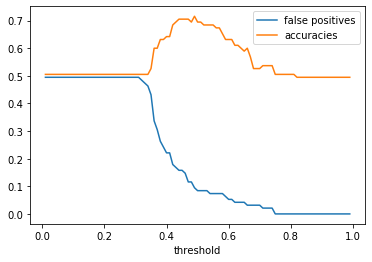

In [102]:
false_positives = []
for thresh in np.arange(1, 100)/100:
    labeled_1 = np.array([1 if x >= thresh else 0 for x in predictions_df.probability_HIGH.values])
    fp = np.mean((y_test == 0) & (labeled_1 == 1))
    false_positives.append(fp)
   

accuracy = []
for thresh in np.arange(1, 100)/100:
    labeled_1 = np.array([1 if x >= thresh else 0 for x in predictions_df.probability_HIGH.values])
    acc = np.mean(labeled_1 == y_test)
    accuracy.append(acc)
    
false_positives = np.array(false_positives)
accuracy = np.array(accuracy)
plt.plot(np.arange(1, 100)/100, false_positives, label='false positives')
plt.plot(np.arange(1, 100)/100, accuracy, label='accuracies')
plt.legend()
plt.xlabel('threshold')
plt.show()

In [103]:
predictions_df['60_precent_threshold']= predictions_df.probability_HIGH.map(lambda x:1 if x>= 0.6 else 0)
predictions_df.head()

,actual,predicted,probability_HIGH,60_precent_threshold
69,1,0,0.380096,0
226,0,1,0.599190,0
285,1,1,0.673817,1
102,1,0,0.391851,0
213,1,1,0.579667,0


In [104]:
pd.DataFrame([accuracy_score(y_test, predictions_df['60_precent_threshold']), 
              precision_score(y_test, predictions_df['60_precent_threshold']),
              recall_score(y_test, predictions_df['60_precent_threshold']),
              f1_score(y_test, predictions_df['60_precent_threshold'])], columns = ['scores 60_percent_threshold'], 
             index = ['accuracy','precision', 'recall', 'f1'])

,scores 60_percent_threshold
accuracy,0.631579
precision,0.782609
recall,0.375000
f1,0.507042


In [105]:
pd.DataFrame(confusion_matrix(y_test, predictions_df['60_precent_threshold']), index = ['actual LOW', 'actual HIGH'], 
             columns = ['predicted LOW', 'predicted HIGH'])

,predicted LOW,predicted HIGH
actual LOW,42,5
actual HIGH,30,18


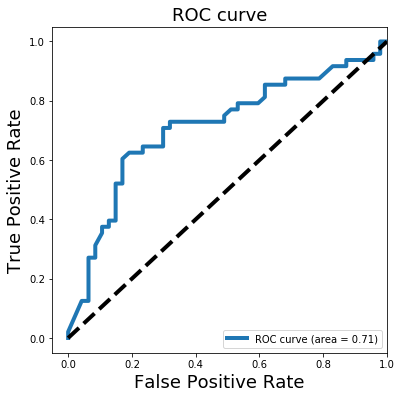

In [106]:
#Finding area under the curve
fpr, tpr, threshold = roc_curve(y_test, predictions_df.probability_HIGH)
roc_auc = auc(fpr, tpr)

# Plotting ROC curve for high salary
plt.figure(figsize=[6, 6])
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc, linewidth=4)
plt.plot([0, 1], [0, 1], 'k--', linewidth=4)
plt.xlim([-0.05, 1.0])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate', fontsize=18)
plt.ylabel('True Positive Rate', fontsize=18)
plt.title('ROC curve', fontsize=18)
plt.legend(loc="lower right")
plt.show()

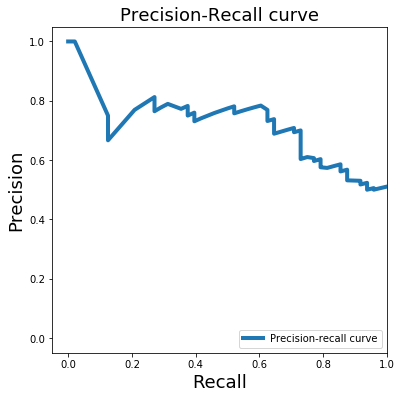

In [107]:
#Finding area under the curve
precision, recall, threshold = precision_recall_curve(y_test, predictions_df.probability_HIGH)


# Plotting precision-recall curve for high salary
plt.figure(figsize=[6, 6])
plt.plot(recall, precision, label='Precision-recall curve', linewidth=4)
plt.xlim([-0.05, 1.0])
plt.ylim([-0.05, 1.05])
plt.xlabel('Recall', fontsize=18)
plt.ylabel('Precision', fontsize=18)
plt.title('Precision-Recall curve', fontsize=18)
plt.legend(loc="lower right")
plt.show()